# Klasifikasi dan Segmentasi Citra Pemutihan Terumbu Karang

In [1]:
# Mengaitkan Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
from google.colab import userdata
import os

# Mengambil token hugging face
os.environ["HF_TOKEN"] = userdata.get('HF_TOKEN')

Mengambil dataset NOAA dari Google Drive menggunakan `drive`, serta mengambil token autentikasi HuggingFace (`HF_TOKEN`) melalui Colab Secrets untuk mengakses dataset Coralscapes.

##  1. Business Understanding



### 1.1 Latar Belakang Permasalahan
Pemutihan terumbu karang (coral bleaching) merupakan ancaman serius terhadap ekosistem laut, dengan ICRI (2025) mencatat 84% terumbu karang dunia terdampak tekanan panas sejak Januari 2023 hingga Maret 2025 di setidaknya 82 negara. Pemantauan konvensional melalui observasi manual oleh penyelam memiliki keterbatasan signifikan: biaya tinggi, cakupan area terbatas, dan rentan terhadap subjektivitas penilaian manusia.
Berdasarkan tinjauan penelitian terdahulu, teridentifikasi tiga research gap yang menjadi dasar penelitian ini:

Sebagian besar penelitian klasifikasi karang masih bergantung pada transfer learning dari dataset umum (ImageNet) yang belum tentu optimal untuk domain citra bawah laut.
Belum banyak penelitian yang mengintegrasikan Grad-CAM secara langsung ke dalam sistem klasifikasi terumbu karang untuk memberikan interpretabilitas visual.
Implementasi model ke dalam antarmuka yang dapat diakses praktisi konservasi (non-teknis) masih sangat terbatas.

### 1.2 Pertanyaan Bisnis (Business Questions)

1. Bagaimana membangun model klasifikasi citra terumbu karang yang mampu membedakan kondisi healthy dan bleached tanpa bergantung pada transfer learning, mengingat karakteristik domain citra bawah laut berbeda dari dataset umum seperti ImageNet?
2. Bagaimana mengatasi keterbatasan interpretabilitas model black-box agar hasil prediksi dapat diverifikasi secara visual oleh praktisi konservasi, bukan hanya berupa output angka/label?
3. Bagaimana menghadirkan hasil klasifikasi dan visualisasi model dalam bentuk yang dapat diakses dan digunakan oleh pengguna non-teknis, tanpa memerlukan pengetahuan pemrograman?

### 1.3 Tujuan Bisnis
Menghasilkan sistem klasifikasi citra bawah laut berbasis Custom CNN yang tidak hanya akurat dalam mendeteksi pemutihan terumbu karang, tetapi juga interpretatif (melalui Grad-CAM) dan dapat diakses langsung oleh pengguna melalui dashboard berbasis web (Streamlit), guna mendukung proses monitoring kondisi terumbu karang secara otomatis dan efisien.

## 2. Data Understanding

In [3]:
# Install library datasets huggingface
!pip install datasets huggingface_hub -q

In [4]:
# === 2.0 LIBRARIES FOR DATA UNDERSTANDING ===
import glob
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from PIL import Image
from datasets import load_dataset

warnings.filterwarnings("ignore")
print("✓ Library Data Understanding siap.")

✓ Library Data Understanding siap.


### 2.1 Data Collection

#### 2.1.1 Dataset Coralscapes

In [5]:
# Load Dataset
coralscapes = load_dataset("EPFL-ECEO/coralscapes")

In [6]:
coralscapes

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 1517
    })
    validation: Dataset({
        features: ['image', 'label'],
        num_rows: 166
    })
    test: Dataset({
        features: ['image', 'label'],
        num_rows: 392
    })
})

Dataset Coralscapes dimuat dari HuggingFace (`EPFL-ECEO/coralscapes`), terdiri dari 1.517 data train, 166 validation, dan 392 test, dengan dua fitur utama: `image` dan `label` (segmentation mask).

#### 2.1.2 Dataset NOAA

In [7]:
import zipfile

zip_path = "/content/drive/MyDrive/[Penulisan Ilmiah]/dataset/noaa-coral.zip"
extract_path = "/content/"

print("Ekstrak dataset...")

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("Ekstrak selesai!")

Ekstrak dataset...
Ekstrak selesai!


### 2.2 Explaratory Data Analysis



#### 2.2.1 Dataset CoralScapes

In [8]:
# Melihat sample dataset
sample = coralscapes['train'][0]
sample

{'image': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=2048x1024>,
 'label': <PIL.PngImagePlugin.PngImageFile image mode=L size=2048x1024>}

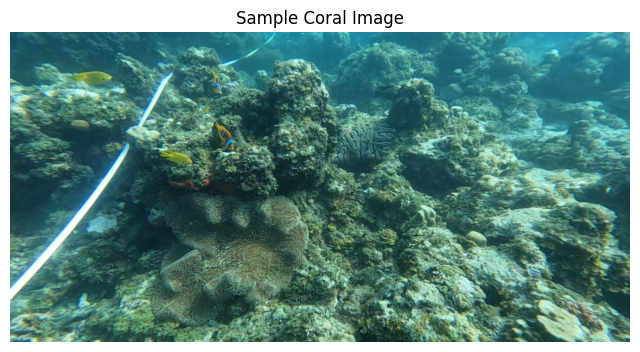

In [9]:
image = sample['image']

plt.figure(figsize=(8,6))
plt.imshow(image)
plt.title("Sample Coral Image")
plt.axis("off")
plt.show()

In [10]:
sample.keys()

dict_keys(['image', 'label'])

In [11]:
# Melihat jumlah data
print("Jumlah data train :", len(coralscapes['train']))

if 'test' in coralscapes:
    print("Jumlah data test :", len(coralscapes['test']))

Jumlah data train : 1517
Jumlah data test : 392


In [12]:
# Melihat size gambar
sizes = []

for i in range(20):
    img = coralscapes['train'][i]['image']
    sizes.append(img.size)

sizes[:10]

[(2048, 1024),
 (2048, 1024),
 (2048, 1024),
 (2048, 1024),
 (2048, 1024),
 (2048, 1024),
 (2048, 1024),
 (2048, 1024),
 (2048, 1024),
 (2048, 1024)]

In [13]:
# Distribusi resolusi gambar
widths = [s[0] for s in sizes]
heights = [s[1] for s in sizes]

df_size = pd.DataFrame({
    'width': widths,
    'height': heights
})

df_size.describe()

,width,height
count,20.0,20.0
mean,2048.0,1024.0
std,0.0,0.0
min,2048.0,1024.0
25%,2048.0,1024.0
50%,2048.0,1024.0
75%,2048.0,1024.0
max,2048.0,1024.0


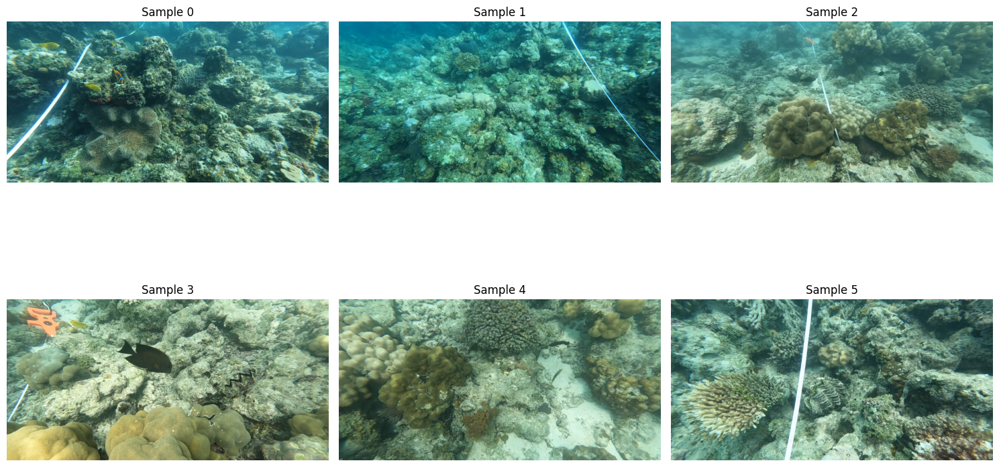

In [14]:
# Visualisasi beberapa sample
fig, axes = plt.subplots(2, 3, figsize=(15,10))

for idx, ax in enumerate(axes.flatten()):
    img = coralscapes['train'][idx]['image']
    ax.imshow(img)
    ax.set_title(f"Sample {idx}")
    ax.axis("off")

plt.tight_layout()
plt.show()

In [15]:
# Fitur dataset
coralscapes['train'].features

{'image': Image(mode=None, decode=True),
 'label': Image(mode=None, decode=True)}

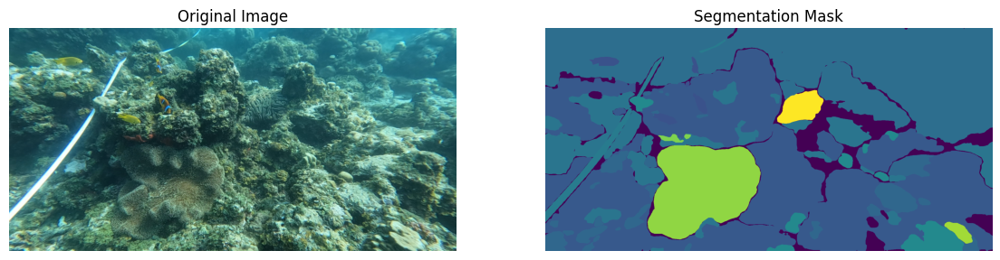

In [16]:
# Visualisasi Mask
sample = coralscapes['train'][0]

image = sample['image']
mask = sample['label']

fig, ax = plt.subplots(1, 2, figsize=(14,6))

ax[0].imshow(image)
ax[0].set_title("Original Image")
ax[0].axis("off")

ax[1].imshow(mask)
ax[1].set_title("Segmentation Mask")
ax[1].axis("off")

plt.show()

Eksplorasi dataset Coralscapes meliputi visualisasi sample citra beserta segmentation mask-nya, serta analisis resolusi gambar. Hasil menunjukkan seluruh sample yang diperiksa memiliki resolusi seragam 2048x1024 piksel, mengindikasikan dataset ini terstandarisasi dari sisi ukuran, namun tidak merepresentasikan crop object-level (karena berupa full scene dengan banyak objek non-karang seperti pasir, ikan, dan alat transect sesuai `id2label`).

#### 2.2.2 Dataset NOAA

Eksplorasi Dataset NOAA sama seperti dataset CoralScapes diatas yang meliputi analisis struktur direktori, menghitung jumlah sampel per split (`train`, `val`, `test`), mengecek resolusi gambar, dan menampilkan sampel citra dari kelas `CORAL` dan `CORAL_BL`.

In [17]:
# Load Dataset
noaa = "/content/noaa-coral"

In [18]:
# Definisikan split dan kelas sesuai struktur direktori kamu
splits = ['train', 'val', 'test']
classes = ['CORAL', 'CORAL_BL']

In [19]:
data_distribution = []

print("Menghitung Data NOAA")
for split in splits:
    for cls in classes:
        # Mencari semua file gambar di dalam subfolder
        search_path = os.path.join(noaa, split, cls, "*.*")
        file_list = glob.glob(search_path)

        # Filter hanya file gambar (jpg, jpeg, png)
        image_list = [f for f in file_list if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        count = len(image_list)

        data_distribution.append({
            'Split': split,
            'Class': 'Healthy (CORAL)' if cls == 'CORAL' else 'Bleached (CORAL_BL)',
            'Count': count
        })
        print(f"[{split.upper()}] Kelas {cls}: {count} gambar")

df_dist = pd.DataFrame(data_distribution)

Menghitung Data NOAA
[TRAIN] Kelas CORAL: 4541 gambar
[TRAIN] Kelas CORAL_BL: 2751 gambar
[VAL] Kelas CORAL: 973 gambar
[VAL] Kelas CORAL_BL: 589 gambar
[TEST] Kelas CORAL: 974 gambar
[TEST] Kelas CORAL_BL: 591 gambar


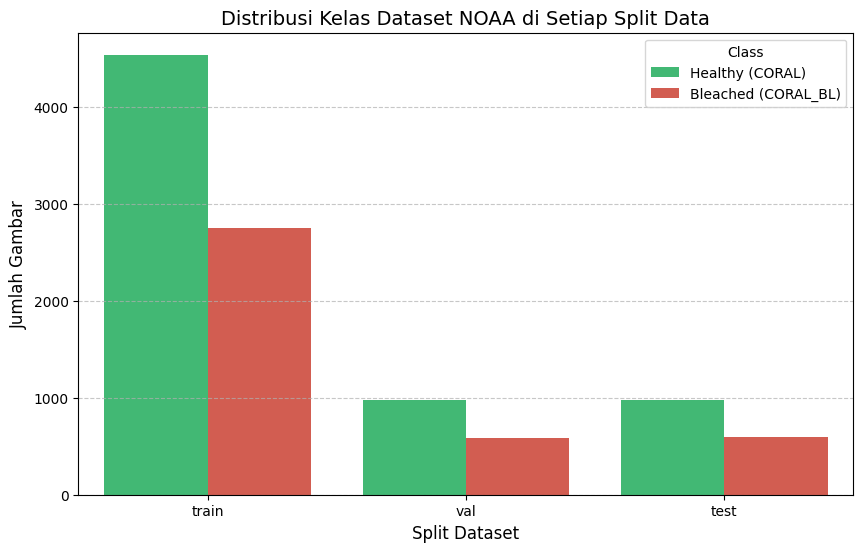

In [20]:
# Visualisasi Distribusi
plt.figure(figsize=(10, 6))
sns.barplot(data=df_dist, x='Split', y='Count', hue='Class', palette=['#2ECC71', '#E74C3C'])
plt.title('Distribusi Kelas Dataset NOAA di Setiap Split Data', fontsize=14)
plt.xlabel('Split Dataset', fontsize=12)
plt.ylabel('Jumlah Gambar', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [21]:
# Mengecek Resolusi Dataset NOAA
noaa_sizes = []
# Ambil 30 sampel acak dari folder train/CORAL untuk analisis dimensi awal
sample_paths = glob.glob(os.path.join(noaa, 'train', 'CORAL', "*.*"))[:30]

for p in sample_paths:
    if p.lower().endswith(('.png', '.jpg', '.jpeg')):
        with Image.open(p) as img:
            noaa_sizes.append(img.size)

df_noaa_size = pd.DataFrame({
    'Width': [s[0] for s in noaa_sizes],
    'Height': [s[1] for s in noaa_sizes]
})

print("Karakteristik Ukuran Gambar NOAA (Sampel):")
display(df_noaa_size.describe())

Karakteristik Ukuran Gambar NOAA (Sampel):


,Width,Height
count,30.0,30.0
mean,224.0,224.0
std,0.0,0.0
min,224.0,224.0
25%,224.0,224.0
50%,224.0,224.0
75%,224.0,224.0
max,224.0,224.0


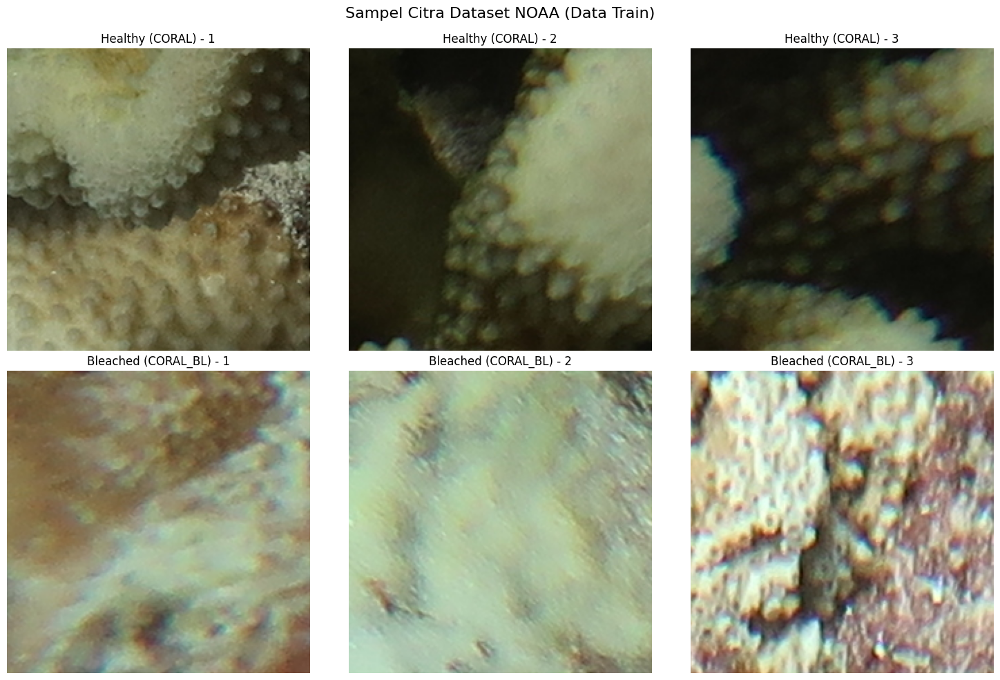

In [22]:
# Menampilkan sample
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle("Sampel Citra Dataset NOAA (Data Train)", fontsize=16)

# Ambil 3 gambar dari masing-masing kelas
healthy_train_samples = sorted(glob.glob(os.path.join(noaa, 'train', 'CORAL', "*.*")))[:3]
bleached_train_samples = sorted(glob.glob(os.path.join(noaa, 'train', 'CORAL_BL', "*.*")))[:3]

# Tampilkan Healthy (Baris Atas)
for i, img_path in enumerate(healthy_train_samples):
    img = Image.open(img_path)
    axes[0, i].imshow(img)
    axes[0, i].set_title(f"Healthy (CORAL) - {i+1}")
    axes[0, i].axis('off')

# Tampilkan Bleached (Baris Bawah)
for i, img_path in enumerate(bleached_samples := bleached_train_samples):
    img = Image.open(img_path)
    axes[1, i].imshow(img)
    axes[1, i].set_title(f"Bleached (CORAL_BL) - {i+1}")
    axes[1, i].axis('off')

plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.show()

Dataset NOAA dimuat dari hasil ekstraksi zip, dengan struktur direktori per split (train/val/test) dan per kelas (CORAL, CORAL_BL). Distribusi kelas menunjukkan ketidakseimbangan yang konsisten di setiap split — kelas CORAL (healthy) lebih dominan dibanding CORAL_BL (bleached), mengindikasikan perlunya penanganan class imbalance pada tahap modeling.

## 3. Data Preparation

Tahapan ini meliputi:
1. **Load Data NOAA & CoralScapes:** Memuat gambar dari folder dataset NOAA & Coralscapes serta me-resize ke ukuran standar.
2. **Crop & Ekstrak Coralscapes:** Menggunakan *masking* untuk mengambil area terumbu karang bleached dan healthy saja.
3. **Membersihkan data Coralscapes & NOAA:** Menyaring dataset Coralscapes menggunakan varians piksel untuk membuang gambar homogen, serta dataset NOAA menggunakan filter Laplacian untuk mengeliminasi gambar buram (blur).
4. **Splitting & Penggabungan:** Membagi dataset menjadi subset training, validation, dan testing, kemudian menggabungkan data dari kedua sumber secara proporsional.
5. **Augmentasi Data:** Menerapkan transformasi gambar seperti rotasi, pergeseran, dan pembalikan (flipping) secara acak untuk memperkaya variasi data training dan mencegah overfitting.
6. **Genarator & Balancing:** Menerapkan generator data untuk memuat gambar secara efisien per batch sekaligus menangani ketidakseimbangan jumlah kelas (class imbalance) melalui teknik oversampling atau pembobotan.

In [23]:
# === 3.0 LIBRARIES FOR DATA PREPARATION ===
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.utils import resample, class_weight
import gc
import random

### 3.1 Load & Crop Gambar

#### 3.1.1 Dataset NOAA

In [24]:
# Menentukan ukuran gambar
IMG_SIZE = (128, 128)

def load_noaa_split(base_path, split_name):
    X, y = [], []
    classes = {'CORAL': 0, 'CORAL_BL': 1} # 0 untuk Healthy, 1 untuk Bleached

    for cls_name, label in classes.items():
        folder_path = os.path.join(base_path, split_name, cls_name, "*.*")
        for img_path in glob.glob(folder_path):
            if img_path.lower().endswith(('.png', '.jpg', '.jpeg')):
                img = cv2.imread(img_path)
                if img is not None:
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    img = cv2.resize(img, IMG_SIZE)
                    X.append(img)
                    y.append(label)
    return np.array(X), np.array(y)

print("Loading NOAA Dataset...")
X_noaa_train, y_noaa_train = load_noaa_split(noaa, 'train')
X_noaa_val, y_noaa_val = load_noaa_split(noaa, 'val')
X_noaa_test, y_noaa_test = load_noaa_split(noaa, 'test')

print(f"NOAA Train: {X_noaa_train.shape[0]} | Val: {X_noaa_val.shape[0]} | Test: {X_noaa_test.shape[0]}")

Loading NOAA Dataset...
NOAA Train: 7292 | Val: 1562 | Test: 1565


#### 3.1.2 Dataset Coralscapes

In [25]:
# Mapping id dataset CoralScapes
id2label = {
  1: "seagrass",
  2: "trash",
  3: "other coral dead",
  4: "other coral bleached",
  5: "sand",
  6: "other coral alive",
  7: "human",
  8: "transect tools",
  9: "fish",
  10: "algae covered substrate",
  11: "other animal",
  12: "unknown hard substrate",
  13: "background",
  14: "dark",
  15: "transect line",
  16: "massive/meandering bleached",
  17: "massive/meandering alive",
  18: "rubble",
  19: "branching bleached",
  20: "branching dead",
  21: "millepora",
  22: "branching alive",
  23: "massive/meandering dead",
  24: "clam",
  25: "acropora alive",
  26: "sea cucumber",
  27: "turbinaria",
  28: "table acropora alive",
  29: "sponge",
  30: "anemone",
  31: "pocillopora alive",
  32: "table acropora dead",
  33: "meandering bleached",
  34: "stylophora alive",
  35: "sea urchin",
  36: "meandering alive",
  37: "meandering dead",
  38: "crown of thorn",
  39: "dead clam"
}


In [26]:
# Menentukan ukuran gambar
IMG_SIZE = (128, 128)

# Fungsi untuk mengekstrak crop dari dataset CoralScapes
def extract_capped_crops_from_hf(hf_splits, target_size=IMG_SIZE, healthy_cap=4000, seed=42):
    """
    Ekstrak crop dari beberapa split HF sekaligus, dengan reservoir sampling
    untuk Healthy (supaya nggak pernah nyimpen lebih dari healthy_cap di memory),
    dan ambil semua Bleached (karena jumlahnya sedikit, aman disimpan semua).
    """
    random.seed(seed)
    bleached_ids = [4, 16, 19, 33]
    healthy_ids = [6, 17, 22, 25, 28, 31, 34, 36]

    X_bleached, y_bleached = [], []  # ambil semua, list ini kecil (~1734 max)

    # Reservoir untuk Healthy — ukuran tetap = healthy_cap
    X_healthy_reservoir = [None] * healthy_cap
    healthy_seen_count = 0  # total Healthy yang sudah "dilihat" (bukan disimpan)

    for hf_split in hf_splits:
        for item in hf_split:
            img = np.array(item['image'])
            mask = np.array(item['label'])

            # Bleached: simpan semua
            for pixel_val in bleached_ids:
                binary_mask = (mask == pixel_val).astype(np.uint8) * 255
                contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
                for cnt in contours:
                    x, y, w, h = cv2.boundingRect(cnt)
                    if w > 40 and h > 40:
                        crop = cv2.resize(img[y:y+h, x:x+w], target_size)
                        X_bleached.append(crop)
                        y_bleached.append(1)

            # Healthy: reservoir sampling, RAM-nya nggak pernah lewat healthy_cap
            for pixel_val in healthy_ids:
                binary_mask = (mask == pixel_val).astype(np.uint8) * 255
                contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
                for cnt in contours:
                    x, y, w, h = cv2.boundingRect(cnt)
                    if w > 40 and h > 40:
                        crop = cv2.resize(img[y:y+h, x:x+w], target_size)
                        if healthy_seen_count < healthy_cap:
                            X_healthy_reservoir[healthy_seen_count] = crop
                        else:
                            j = random.randint(0, healthy_seen_count)
                            if j < healthy_cap:
                                X_healthy_reservoir[j] = crop
                        healthy_seen_count += 1

        # Bebasin reference ke split yang udah selesai diproses
        gc.collect()

    n_healthy_kept = min(healthy_seen_count, healthy_cap)
    X_healthy = X_healthy_reservoir[:n_healthy_kept]
    y_healthy = [0] * n_healthy_kept

    X_cs_capped = np.array(X_bleached + X_healthy)
    y_cs_capped = np.array(y_bleached + y_healthy)

    print(f"Healthy terlihat total: {healthy_seen_count} | disimpan: {n_healthy_kept}")
    print(f"Bleached disimpan: {len(y_bleached)}")

    return X_cs_capped, y_cs_capped

In [27]:
# Panggil sekali untuk ketiga split, peak memory jauh lebih kecil
X_cs_capped, y_cs_capped = extract_capped_crops_from_hf(
    [coralscapes['train'], coralscapes['validation'], coralscapes['test']],
    healthy_cap=4000
)

print(f"Total CS setelah capping -> Healthy: {(y_cs_capped==0).sum()} | Bleached: {(y_cs_capped==1).sum()}")

Healthy terlihat total: 27949 | disimpan: 4000
Bleached disimpan: 1734
Total CS setelah capping -> Healthy: 4000 | Bleached: 1734


Data NOAA dimuat dan di-resize ke ukuran standar 128x128 piksel. Untuk dataset Coralscapes, dilakukan proses cropping menggunakan segmentation mask untuk mengekstrak region karang sehat dan bleached secara spesifik, dengan teknik reservoir sampling untuk membatasi (cap) jumlah crop kelas healthy hingga 4.000 sample — mencegah dominasi berlebihan kelas mayoritas dari Coralscapes yang sebenarnya memiliki hingga 27.949 crop healthy mentah.

### 3.2 Audit Visual & Domain Mismatch

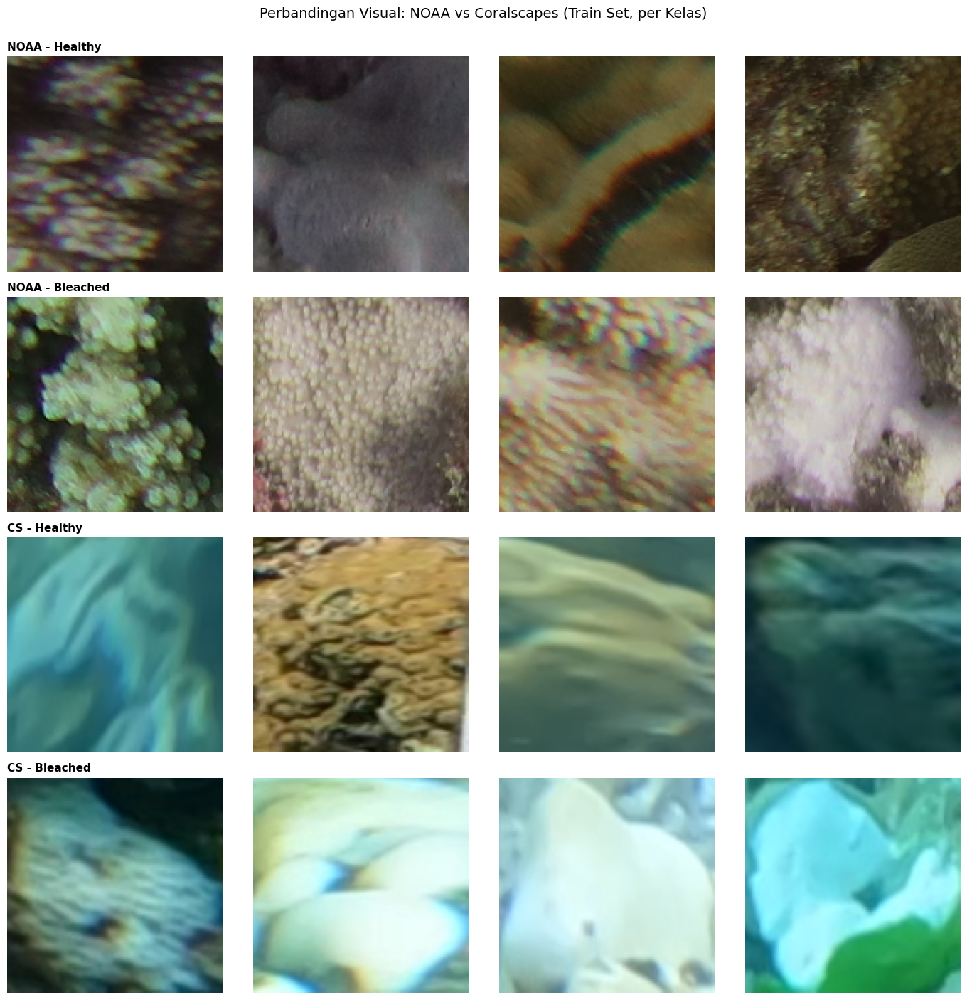


--- Statistik kasar (indikasi domain shift) ---
NOAA Train           | brightness avg: 105.33 | sharpness (blur proxy) avg:   274.55
CS Capped (pre-split) | brightness avg: 123.20 | sharpness (blur proxy) avg:   380.82


In [28]:
# Visualisasi perbandingan sample NOAA vs Coralscapes (cek domain mismatch)
# karena variabel mentah per-sumber sudah dihapus setelah itu.

fig, axes = plt.subplots(4, 4, figsize=(14, 14))

# Ambil index acak dari masing-masing sumber & kelas
noaa_healthy_idx = np.where(y_noaa_train == 0)[0]
noaa_bleached_idx = np.where(y_noaa_train == 1)[0]
cs_healthy_idx = np.where(y_cs_capped == 0)[0]
cs_bleached_idx = np.where(y_cs_capped == 1)[0]

np.random.seed(42)
samples = {
    "NOAA - Healthy": (X_noaa_train, np.random.choice(noaa_healthy_idx, 4, replace=False)),
    "NOAA - Bleached": (X_noaa_train, np.random.choice(noaa_bleached_idx, 4, replace=False)),
    "CS - Healthy": (X_cs_capped, np.random.choice(cs_healthy_idx, 4, replace=False)),
    "CS - Bleached": (X_cs_capped, np.random.choice(cs_bleached_idx, 4, replace=False)),
}

for row, (label, (X_src, idxs)) in enumerate(samples.items()):
    for col, idx in enumerate(idxs):
        ax = axes[row, col]
        ax.imshow(X_src[idx])
        ax.set_title(label if col == 0 else "", loc='left', fontsize=11, fontweight='bold')
        ax.axis('off')

plt.suptitle("Perbandingan Visual: NOAA vs Coralscapes (Train Set, per Kelas)", fontsize=14, y=1.0)
plt.tight_layout()
plt.show()

# Tambahan: cek statistik sederhana (rata-rata brightness & sharpness) buat kuantifikasi awal
def quick_stats(X, name):
    gray = np.mean(X, axis=-1)  # rata-rata channel jadi grayscale kasar
    brightness = gray.mean()
    sharpness = np.mean([cv2.Laplacian(img.astype(np.uint8), cv2.CV_64F).var() for img in gray[:200]])  # sample 200 biar cepat
    print(f"{name:20s} | brightness avg: {brightness:6.2f} | sharpness (blur proxy) avg: {sharpness:8.2f}")

print("\n--- Statistik kasar (indikasi domain shift) ---")
quick_stats(X_noaa_train, "NOAA Train")
quick_stats(X_cs_capped, "CS Capped (pre-split)")

In [29]:
# Mengecek Varians pada tiap dataset
noaa_var = np.array([img.astype('float32').std() for img in X_noaa_train])
cs_var = np.array([img.astype('float32').std() for img in X_cs_capped])
print(f"NOAA variance -> mean: {noaa_var.mean():.2f}, p10: {np.percentile(noaa_var,10):.2f}")
print(f"CS variance   -> mean: {cs_var.mean():.2f}, p10: {np.percentile(cs_var,10):.2f}")

NOAA variance -> mean: 38.23, p10: 22.02
CS variance   -> mean: 46.10, p10: 32.09


Berdasarkan pengujian kuantitatif terhadap varians nilai intensitas piksel, diperoleh nilai rata-rata (mean) varians pada dataset NOAA sebesar 38,23 dengan persentil ke-10 (p10) berada di angka 22,02. Sementara itu, dataset Coralscapes menunjukkan tingkat keberagaman visual yang lebih tinggi dengan nilai mean varians mencapai 46,10 dan p10 sebesar 32,09. Perbedaan metrik ini secara numerik mengonfirmasi adanya domain mismatch dan varians internal yang cukup signifikan antar-dataset, di mana dataset Coralscapes memiliki sebaran karakteristik rona warna, tekstur, dan pencahayaan yang lebih heterogen dibandingkan dengan dataset NOAA.

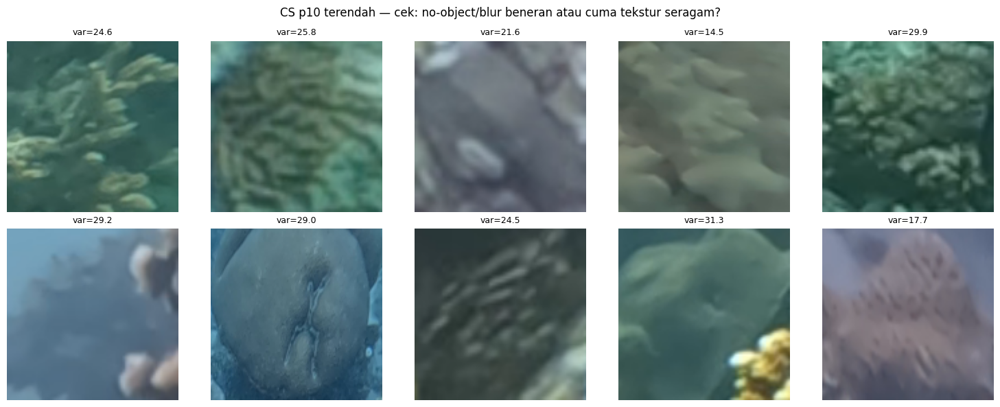

In [30]:
# Sanity check: lihat sample CS yang bakal dibuang oleh auto_clean_low_variance
cs_var = np.array([img.astype('float32').std() for img in X_cs_capped])
p10_threshold_cs = np.percentile(cs_var, 10)
flagged_cs = np.where(cs_var <= p10_threshold_cs)[0]

fig, axes = plt.subplots(2, 5, figsize=(15, 6))
sample_idx = np.random.choice(flagged_cs, 10, replace=False)
for i, idx in enumerate(sample_idx):
    ax = axes[i // 5, i % 5]
    ax.imshow(X_cs_capped[idx])
    ax.set_title(f"var={cs_var[idx]:.1f}", fontsize=9)
    ax.axis('off')
plt.suptitle("CS p10 terendah — cek: no-object/blur beneran atau cuma tekstur seragam?")
plt.tight_layout()
plt.show()

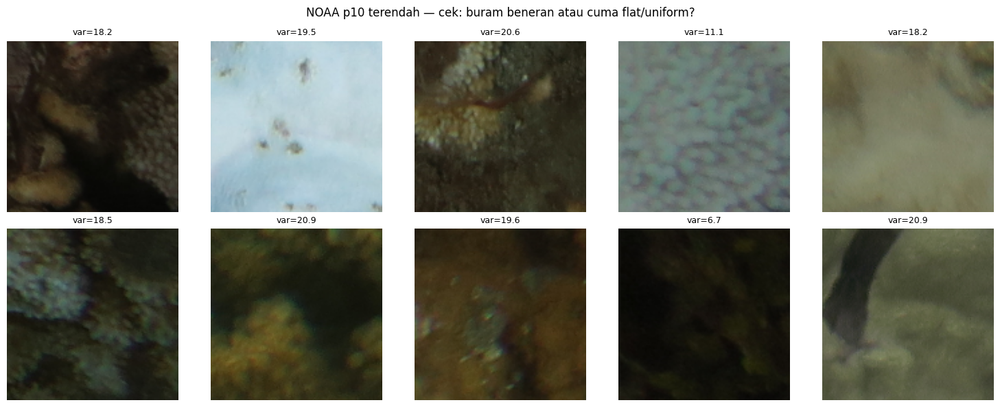

In [31]:
noaa_var = np.array([img.astype('float32').std() for img in X_noaa_train])
p10_threshold_noaa = np.percentile(noaa_var, 10)
flagged_noaa = np.where(noaa_var <= p10_threshold_noaa)[0]

# Mengecek Visualisasi dataset NOAA yang bener-bener blur atau tidak?
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
sample_idx = np.random.choice(flagged_noaa, 10, replace=False)
for i, idx in enumerate(sample_idx):
    ax = axes[i // 5, i % 5]
    ax.imshow(X_noaa_train[idx])
    ax.set_title(f"var={noaa_var[idx]:.1f}", fontsize=9)
    ax.axis('off')
plt.suptitle("NOAA p10 terendah — cek: buram beneran atau cuma flat/uniform?")
plt.tight_layout()
plt.show()

Dilakukan perbandingan visual antara sample NOAA dan Coralscapes untuk memeriksa domain mismatch (perbedaan karakteristik visual antar sumber data), dan juga varians antar dataset untuk **mengidentifikasi serta menyeleksi citra berkualitas rendah (seperti *blur*, *out of focus*, atau area kosong tanpa objek) menggunakan pendekatan *variance thresholding*.**

**Tujuan & Mekanisme Analisis Varians:**

1. **Deteksi Data Bermasalah (*Sanity Check*):** 
   * Nilai *Standard Deviation* (`std()`) dihitung pada setiap gambar dari kedua dataset untuk mengukur tingkat kontras dan detail visualnya. Gambar dengan varians yang sangat rendah biasanya mengindikasikan citra yang buram (*blur*), *over-exposed*, atau hanya berisi area pasir/air kosong.

2. **Penentuan Ambang Batas (*Thresholding* p10):**
   * Batas bawah ditentukan secara dinamis menggunakan **persentil ke-10 (`p10_threshold`)** dari masing-masing dataset. Gambar yang berada di bawah atau sama dengan ambang batas ini akan ditandai (`flagged`) sebagai kandidat data yang akan dibuang oleh fungsi pembersih otomatis (`auto_clean_low_variance`).

3. **Validasi Visual Lintas Domain:**
   * **Dataset Coralscapes (CS):** Visualisasi 10 sampel acak dengan varians terendah digunakan untuk memvalidasi apakah citra tersebut memang rusak (*no-object*/*blur*) atau sekadar memiliki tekstur yang seragam namun tetap valid untuk dipertahankan.
   * **Dataset NOAA:** Proses yang sama diterapkan pada data latih NOAA untuk memastikan karakteristik *noise* atau *blur* lokal yang spesifik pada domain NOAA tidak secara tidak sengaja membuang informasi penting terkait terumbu karang.

Langkah inspeksi visual ini krusial untuk memastikan bahwa proses *auto-cleaning* berbasis varians bekerja secara objektif dan tidak memicu hilangnya variasi data penting akibat perbedaan karakteristik bawaan (*domain mismatch*) antara NOAA dan Coralscapes.

### 3.3 Data Cleaning

#### 3.3.1 Data CoralScapes

In [32]:
# Auto-cleaning berbasis threshold variance, dijalankan pada X_cs_capped (SEBELUM split)
def auto_clean_low_variance(X, y, threshold_percentile=10):
    variances = np.array([img.astype('float32').std() for img in X])
    threshold = np.percentile(variances, threshold_percentile)
    keep_mask = variances > threshold

    print(f"Threshold ({threshold_percentile}th percentile): {threshold:.2f}")
    print(f"Dibuang: {(~keep_mask).sum()} dari {len(X)}")
    print(f"Distribusi kelas dibuang -> Healthy: {np.sum(y[~keep_mask]==0)}, Bleached: {np.sum(y[~keep_mask]==1)}")
    return X[keep_mask], y[keep_mask]

X_cs_capped_cleaned, y_cs_capped_cleaned = auto_clean_low_variance(
    X_cs_capped, y_cs_capped, threshold_percentile=10
)

Threshold (10th percentile): 32.09
Dibuang: 574 dari 5734
Distribusi kelas dibuang -> Healthy: 546, Bleached: 28


#### 3.3.2 Data NOAA

In [33]:
# Auto cleaning menggunakan Laplacian variance
def auto_clean_blur(X, y, threshold_percentile=5):
    def blur_score(img):
        gray = cv2.cvtColor(img.astype('uint8'), cv2.COLOR_RGB2GRAY)
        return cv2.Laplacian(gray, cv2.CV_64F).var()

    scores = np.array([blur_score(img) for img in X])
    threshold = np.percentile(scores, threshold_percentile)
    keep_mask = scores > threshold

    print(f"Threshold Laplacian ({threshold_percentile}th percentile): {threshold:.2f}")
    print(f"Dibuang: {(~keep_mask).sum()} dari {len(X)}")
    print(f"Distribusi kelas dibuang -> Healthy: {np.sum(y[~keep_mask]==0)}, Bleached: {np.sum(y[~keep_mask]==1)}")
    return X[keep_mask], y[keep_mask]

X_noaa_train_cleaned, y_noaa_train_cleaned = auto_clean_blur(
    X_noaa_train, y_noaa_train, threshold_percentile=5
)

Threshold Laplacian (5th percentile): 40.10
Dibuang: 365 dari 7292
Distribusi kelas dibuang -> Healthy: 211, Bleached: 154


Bagian ini melakukan pembersihan data gambar secara otomatis (auto-cleaning) menggunakan dua metode penyaringan berbasis threshold percentile untuk mengeliminasi gambar berkualitas rendah sebelum dilakukan data splitting:

- auto_clean_low_variance(coralscapes): Menyaring gambar berdasarkan nilai standar deviasi piksel. Gambar dengan variasi warna atau informasi yang terlalu rendah (di bawah persentil ke-10) akan dibuang karena dianggap kurang informatif atau homogen.

- auto_clean_blur(NOAA): Mendeteksi dan membuang gambar yang buram (blurry) menggunakan varians dari operator Laplacian (OpenCV). Gambar dengan skor ketajaman di bawah persentil ke-5 akan dieliminasi untuk memastikan model hanya dilatih dengan gambar yang fokus dan jelas.

Kedua dataset menggunakan logika yang berbeda karena dataset Coralscapes (hasil crop segmentasi) rentan terhadap masalah gambar kosong atau seragam, sehingga efisien disaring menggunakan standar deviasi piksel (pixel variance) untuk membuang area yang tidak informatif. Sebaliknya, dataset NOAA (foto utuh bawah air) lebih rentan terhadap masalah kekaburan (blur) akibat arus atau visibilitas air, sehingga lebih tepat disaring menggunakan varians dari filter Laplacian (Laplacian variance) yang mendeteksi ketajaman tepi (edge) gambar secara spesifik, bukan sekadar keragaman warna pikselnya.

### 3.4 Data Splitting

In [34]:
# stratified split
X_cs_train, X_cs_temp, y_cs_train, y_cs_temp = train_test_split(
    X_cs_capped_cleaned, y_cs_capped_cleaned, test_size=0.30, stratify=y_cs_capped_cleaned, random_state=42
)
X_cs_val, X_cs_test, y_cs_val, y_cs_test = train_test_split(
    X_cs_temp, y_cs_temp, test_size=0.50, stratify=y_cs_temp, random_state=42
)

del X_cs_capped_cleaned, y_cs_capped_cleaned, X_cs_temp, y_cs_temp
gc.collect()

print(f"CS Train: {X_cs_train.shape[0]} | Val: {X_cs_val.shape[0]} | Test: {X_cs_test.shape[0]}")

CS Train: 3612 | Val: 774 | Test: 774


In [35]:
# Melihat berapa banyak data di masing-masing dataset
print(f"NOAA Train   : {X_noaa_train.shape[0]}")
print(f"CS Train     : {X_cs_train.shape[0]}")
print(f"NOAA Val     : {X_noaa_val.shape[0]}")
print(f"CS Val       : {X_cs_val.shape[0]}")
print(f"NOAA Test    : {X_noaa_test.shape[0]}")
print(f"CS Test      : {X_cs_test.shape[0]}")

NOAA Train   : 7292
CS Train     : 3612
NOAA Val     : 1562
CS Val       : 774
NOAA Test    : 1565
CS Test      : 774


In [36]:
# 1. Cek distribusi sumber (NOAA vs CS) per kelas, per split
import pandas as pd

def source_distribution(y_noaa, y_cs, split_name):
    noaa_healthy = (y_noaa == 0).sum()
    noaa_bleached = (y_noaa == 1).sum()
    cs_healthy = (y_cs == 0).sum()
    cs_bleached = (y_cs == 1).sum()

    total_healthy = noaa_healthy + cs_healthy
    total_bleached = noaa_bleached + cs_bleached

    print(f"\n=== {split_name} ===")
    print(f"Healthy  : NOAA={noaa_healthy:5d} ({noaa_healthy/total_healthy*100:5.1f}%) | "
          f"CS={cs_healthy:5d} ({cs_healthy/total_healthy*100:5.1f}%) | total={total_healthy}")
    print(f"Bleached : NOAA={noaa_bleached:5d} ({noaa_bleached/total_bleached*100:5.1f}%) | "
          f"CS={cs_bleached:5d} ({cs_bleached/total_bleached*100:5.1f}%) | total={total_bleached}")

    return {
        'split': split_name,
        'healthy_noaa_pct': noaa_healthy/total_healthy*100,
        'healthy_cs_pct': cs_healthy/total_healthy*100,
        'bleached_noaa_pct': noaa_bleached/total_bleached*100,
        'bleached_cs_pct': cs_bleached/total_bleached*100,
    }

rows = []
rows.append(source_distribution(y_noaa_train, y_cs_train, "TRAIN"))
rows.append(source_distribution(y_noaa_val, y_cs_val, "VAL"))
rows.append(source_distribution(y_noaa_test, y_cs_test, "TEST"))

df_confound = pd.DataFrame(rows)
print("\n--- Ringkasan ---")
print(df_confound.to_string(index=False))

# Sinyal bahaya: kalau selisih (healthy_noaa_pct - bleached_noaa_pct) > ~15-20 poin,
# itu confounding kuat — model punya insentif belajar "sumber" bukan "status bleaching"
df_confound['confound_gap'] = (df_confound['healthy_noaa_pct'] - df_confound['bleached_noaa_pct']).abs()
print(f"\nGap confounding per split (semakin besar semakin bahaya):")
print(df_confound[['split', 'confound_gap']].to_string(index=False))


=== TRAIN ===
Healthy  : NOAA= 4541 ( 65.3%) | CS= 2418 ( 34.7%) | total=6959
Bleached : NOAA= 2751 ( 69.7%) | CS= 1194 ( 30.3%) | total=3945

=== VAL ===
Healthy  : NOAA=  973 ( 65.3%) | CS=  518 ( 34.7%) | total=1491
Bleached : NOAA=  589 ( 69.7%) | CS=  256 ( 30.3%) | total=845

=== TEST ===
Healthy  : NOAA=  974 ( 65.3%) | CS=  518 ( 34.7%) | total=1492
Bleached : NOAA=  591 ( 69.8%) | CS=  256 ( 30.2%) | total=847

--- Ringkasan ---
split  healthy_noaa_pct  healthy_cs_pct  bleached_noaa_pct  bleached_cs_pct
TRAIN         65.253628       34.746372          69.733840        30.266160
  VAL         65.258216       34.741784          69.704142        30.295858
 TEST         65.281501       34.718499          69.775679        30.224321

Gap confounding per split (semakin besar semakin bahaya):
split  confound_gap
TRAIN      4.480212
  VAL      4.445926
 TEST      4.494178


Dataset NOAA dan Coralscapes (hasil crop) di-split secara terpisah dengan stratifikasi (70% train, 15% val, 15% test) sebelum digabung, bertujuan menjaga proporsi sumber data (NOAA vs Coralscapes) tetap konsisten di setiap split. Hasil penggabungan menghasilkan total 10.539 data train, 2.336 data validation, dan 2.339 data test.

### 3.5 Gabungin Data

In [37]:
# MENGGABUNGKAN DATASET CORALSCAPES & NOAA
print("\nMenggabungkan dataset...")
X_train_final = np.concatenate((X_noaa_train_cleaned, X_cs_train), axis=0)
y_train_final = np.concatenate((y_noaa_train_cleaned, y_cs_train), axis=0)

X_val_final = np.concatenate((X_noaa_val, X_cs_val), axis=0)
y_val_final = np.concatenate((y_noaa_val, y_cs_val), axis=0)

# track sumber data per sample di val set (0=NOAA, 1=Coralscapes)
source_val_final = np.concatenate((
    np.zeros(len(X_noaa_val)),
    np.ones(len(X_cs_val))
))

X_test_final = np.concatenate((X_noaa_test, X_cs_test), axis=0)
y_test_final = np.concatenate((y_noaa_test, y_cs_test), axis=0)

print(f"Total Train : {X_train_final.shape[0]} gambar")
print(f"Total Val   : {X_val_final.shape[0]} gambar")
print(f"Total Test  : {X_test_final.shape[0]} gambar")


Menggabungkan dataset...
Total Train : 10539 gambar
Total Val   : 2336 gambar
Total Test  : 2339 gambar


**Penggabungan Dataset Lintas Domain (Coralscapes & NOAA)**

Proses ini menyatukan subset data latih, validasi, dan uji dari dua sumber berbeda (NOAA yang telah melalui tahap pembersihan varians serta Coralscapes) menggunakan fungsi `np.concatenate` untuk membangun satu *pipeline* data yang komprehensif. Guna memitigasi isu *domain mismatch*, dipasang larik penanda `source_val_final` (nilai `0` untuk NOAA dan `1` untuk Coralscapes) pada data validasi yang berfungsi melacak asal-usul sumber setiap citra secara spesifik, sehingga evaluasi performa generalisasi model pada masing-masing karakteristik domain data dapat dianalisis secara akurat di akhir pengujian.

Kode dibawah digunakan untuk membersihkan memori di colab/kaggle agar tidak crash

In [38]:
print("Membersihkan memori (Garbage Collection)...")

# Memastikan label dalam bentuk float32 (ukurannya sangat kecil, jadi aman untuk RAM)
y_train_final = y_train_final.astype('float32')
y_val_final = y_val_final.astype('float32')
y_test_final = y_test_final.astype('float32')

Membersihkan memori (Garbage Collection)...


In [39]:
# Hapus pecahan variable yang tidak terpakai
try:
    del X_noaa_train, y_noaa_train, X_cs_train, y_cs_train
    del X_noaa_val, y_noaa_val, X_cs_val, y_cs_val
    del X_noaa_test, y_noaa_test, X_cs_test, y_cs_test
    del X_noaa_train_cleaned, y_noaa_train_cleaned
    # Hapus juga objek dataset coralscapes dari Hugging Face jika masih tersimpan di variabel tertentu
except NameError:
    pass

# Mengosongkan RAM
gc.collect()

print("Bentuk akhir data Train (uint8):", X_train_final.shape)
print("Data Preparation Selesai")

Bentuk akhir data Train (uint8): (10539, 128, 128, 3)
Data Preparation Selesai


### 3.6 Data Augmentasi

In [40]:
# Menambahkan Augmentasi Data
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np

data_augmentation = models.Sequential([
    layers.RandomFlip("horizontal_and_vertical"),
    layers.RandomRotation(0.2),
    layers.RandomZoom(0.15),
    layers.RandomContrast(0.15)
], name="data_augmentation_layer")

Proses penambahan variasi data dilakukan menggunakan API `tf.keras.layers` yang diintegrasikan langsung ke dalam arsitektur model (atau dijalankan *on-the-fly*):

* **Mekanisme Kerja:** Memanipulasi citra secara acak di setiap *epoch* menggunakan kombinasi transformasi spasial dan kontras:
  * `RandomFlip`: Membalik gambar secara horizontal dan vertikal.
  * `RandomRotation`: Memutar gambar secara acak hingga rentang 20% (`0.2`).
  * `RandomZoom`: Melakukan perbesaran/pengecilan acak sebesar 15% (`0.15`).
  * `RandomContrast`: Mengubah ketajaman kontras warna acak sebesar 15% (`0.15`).
* **Keuntungan:** Secara aktif memperkaya variasi citra terumbu karang tanpa mengubah label asli. Langkah ini efektif memperluas cakupan data latih untuk menekan risiko *overfitting* serta meningkatkan kemampuan generalisasi model terhadap data baru.

### 3.7 Balancing & Generator Pipeline
Sesuai metodologi CRISP-DM, seluruh proses manipulasi data dilakukan sebelum tahap modeling. Di sini kita menstabilkan distribusi kelas pada data Validation dan menyiapkan generator untuk data Training.

In [46]:
# === 3.7 BALANCING & GENERATOR (Data Preparation) ===
from sklearn.utils import resample

# 1. Menstabilkan Validation Set (Rasio 1:1)
idx_h_val = np.where(y_val_final == 0)[0]
idx_b_val = np.where(y_val_final == 1)[0]
idx_h_val_down = resample(idx_h_val, n_samples=len(idx_b_val), random_state=42)
idx_val_balanced = np.concatenate([idx_h_val_down, idx_b_val])
np.random.shuffle(idx_val_balanced)

X_val_stable = X_val_final[idx_val_balanced].astype('float32')
y_val_stable = y_val_final[idx_val_balanced].astype('float32')

# 2. Generator dengan Rasio 60:40 (Healthy:Bleached)
def balanced_gen():
    bleached_idx = np.where(y_train_final == 1)[0]
    healthy_idx = np.where(y_train_final == 0)[0]
    while True:
        h_batch = np.random.choice(healthy_idx, 38) # ~60%
        b_batch = np.random.choice(bleached_idx, 26) # ~40%
        batch_X = np.concatenate([X_train_final[h_batch], X_train_final[b_batch]]).astype('float32')
        batch_y = np.concatenate([y_train_final[h_batch], y_train_final[b_batch]])
        p = np.random.permutation(64)
        yield batch_X[p], batch_y[p]

# 3. Konversi ke tf.data.Dataset
train_ds = tf.data.Dataset.from_generator(
    balanced_gen,
    output_signature=(tf.TensorSpec(shape=(64, 128, 128, 3), dtype=tf.float32),
                      tf.TensorSpec(shape=(64,), dtype=tf.float32))
).prefetch(tf.data.AUTOTUNE)

val_ds = tf.data.Dataset.from_tensor_slices((X_val_stable, y_val_stable)).batch(64).prefetch(tf.data.AUTOTUNE)

print("✓ Pipeline Data (Balancing & Generator) dipusatkan di Data Preparation.")

✓ Pipeline Data (Balancing & Generator) siap untuk Modeling.


**Balancing & Data Generator Pipeline**

Proses ini dirancang untuk mengatasi ketidakseimbangan data (*class imbalance*) pada *dataset* terumbu karang melalui kombinasi manipulasi distribusi kelas dan optimalisasi pengaliran data:

* **Stabilisasi Data Validasi (Rasio 1:1):** Menggunakan teknik *downsampling* melalui `sklearn.utils.resample` pada kelas mayoritas (*Healthy*) agar jumlahnya seimbang secara presisi dengan kelas minoritas (*Bleached*). Validasi dengan proporsi seimbang ini menjamin evaluasi performa akhir model tetap objektif tanpa terpengaruh bias distribusi data.
* **Custom Balanced Generator (Rasio 60:40):** Membentuk generator dinamis yang secara berkelanjutan menyusun setiap *batch* latihan dengan porsi **38 sampel Healthy (~60%)** dan **26 sampel Bleached (~40%)**. Pendekatan ini memastikan model mendapatkan paparan kelas minoritas yang cukup di setiap langkah iterasi tanpa perlu melakukan duplikasi fisik data pada memori.
* **Optimasi Pipeline tf.data:** Membungkus generator ke dalam `tf.data.Dataset` dengan ukuran *batch* 64 untuk data latih serta validasi. Pemanfaatan fungsi `.prefetch(tf.data.AUTOTUNE)` mengizinkan CPU menyiapkan *batch* data berikutnya sewaktu GPU melakukan proses komputasi, sehingga mampu meminimalkan *bottleneck* selama pelatihan berlangsung.

## 4. Modeling
Membangun arsitektur Custom Convolutional Neural Network (CNN) dari awal tanpa *transfer learning*.

**Karakteristik Utama Model:**

1. **Preprocessing Terintegrasi:** Proses augmentasi data latih berjalan secara dinamis di GPU dan diikuti oleh *layer* `Rescaling` untuk mengubah piksel menjadi rentang `[0, 1]` guna menghemat konsumsi memori RAM.
2. **Feature Extraction & Grad-CAM Ready:** Terdiri dari 3 blok konvolusi bertingkat (32, 64, 128 filter) dengan penamaan khusus `'last_conv_layer'` pada blok terakhir untuk kebutuhan visualisasi lokasi pemutihan karang.
3. **Regulasi Berlapis (Anti-Overfitting):** Mengombinasikan regularisasi L2 (`1e-4`), *Batch Normalization*, *Global Average Pooling*, serta *Dual Dropout* (50% dan 30%) untuk menekan risiko *overfitting* dan mempercepat konvergensi model.

In [41]:
# Import library yang dibutuhkan
from tensorflow.keras import layers, models, regularizers
import tensorflow as tf

In [42]:
# Untuk mengatur random data agar setiap run variance akurasinya tidak beda jauh
SEED = 3
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

### 4.1 Arsitektur CNN

In [ ]:
# === 4.1 ARSITEKTUR MODEL (Modeling) ===
from tensorflow.keras import regularizers

def build_optimized_cnn(input_shape=(128, 128, 3)):
    model = models.Sequential([
        # Menentukan dimensi input gambar (tinggi, lebar, saluran warna)
        layers.Input(shape=input_shape, name='input_layer'),
        
        # Menerapkan augmentasi gambar secara acak (rotasi, flip, dll.) untuk variasi data
        data_augmentation,
        
        # Normalisasi nilai piksel dari rentang [0, 255] ke rentang [0.0, 1.0]
        layers.Rescaling(1./255, name='rescaling_layer'),

        # Blok Konvolusi 1: Ekstraksi fitur dasar (tepi/garis) + regulasi L2
        layers.Conv2D(32, (3,3), padding='same', kernel_regularizer=regularizers.l2(1e-4)),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.MaxPooling2D((2,2)),

        # Blok Konvolusi 2: Ekstraksi fitur menengah (tekstur/pola) + regulasi L2
        layers.Conv2D(64, (3,3), padding='same', kernel_regularizer=regularizers.l2(1e-4)),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.MaxPooling2D((2,2)),
        
        # Blok Konvolusi 3: Ekstraksi fitur kompleks + target visualisasi Grad-CAM
        layers.Conv2D(128, (3,3), padding='same', kernel_regularizer=regularizers.l2(1e-4), name='last_conv_layer'),
        layers.BatchNormalization(),
        layers.Activation('relu'),
        layers.MaxPooling2D((2,2)),

        # Mengubah peta fitur 2D menjadi vektor 1D dengan rata-rata tiap channel
        layers.GlobalAveragePooling2D(),
        
        layers.Dropout(0.5),
        
        # Fully Connected Layer untuk mempelajari kombinasi fitur tingkat tinggi
        layers.Dense(128, activation='relu', kernel_regularizer=regularizers.l2(1e-4)),
        
        layers.Dropout(0.3),
        
        # Output Layer: Klasifikasi biner menggunakan fungsi aktivasi Sigmoid
        layers.Dense(1, activation='sigmoid', name='output_layer')
    ])
    return model

cnn_model = build_optimized_cnn()
cnn_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ data_augmentation_layer         │ (None, 128, 128, 3)    │             0 │
│ (Sequential)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_layer (Rescaling)     │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ last_conv_layer (Conv2D)        │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 110,785 (432.75 KB)

 Trainable params: 110,337 (431.00 KB)

 Non-trainable params: 448 (1.75 KB)

Model dibangun menggunakan topologi Sequential CNN kustom yang ringan dengan total 39.681 parameter (39.393 trainable). Berikut adalah poin inti strukturnya:

1. **Input & Pra-pemrosesan:** Menerima citra berukuran 128x128x3 piksel yang melewati proses augmentasi dinamis dan langsung dinormalisasi ke rentang 0.0–1.0 melalui `rescaling_layer` guna menghemat memori RAM.
2. **Blok Ekstraksi Fitur (3 Tingkat):** Menggunakan susunan filter bertahap yaitu 32, 64, dan 128 filter dengan kernel 3x3 yang masing-masing diperkuat oleh *Batch Normalization*, aktivasi ReLU, regularisasi L2 (`1e-4`), dan *MaxPooling2D*. Blok ke-3 (`last_conv_layer`) disiapkan khusus sebagai target visualisasi peta aktivasi menggunakan algoritma Grad-CAM.
3. **Kepala Klasifikasi:** Fitur spasial diratakan menggunakan `GlobalAveragePooling2D`, lalu disaring lewat regulasi *Dropout* berlapis (50% dan 30%) serta regularisasi L2 sebelum dialirkan ke *Dense layer* (128 neuron) dan berakhir di *Output layer* (1 neuron, Sigmoid) untuk klasifikasi biner (*Healthy* vs *Bleached*).


### 4.2 Pelatihan Model
Tahap ini berfokus murni pada proses training menggunakan pipeline data yang telah disiapkan sebelumnya.


Data validation di-*undersample* agar rasio kelas Healthy:Bleached menjadi 1:1, bertujuan menstabilkan nilai loss saat monitoring training. Untuk data training, digunakan `balanced_generator` yang dibungkus dalam `tf.data.Dataset.from_generator()` beserta `output_signature` dan `.prefetch(AUTOTUNE)` — pendekatan ini menghindari materialisasi seluruh array data ke RAM sekaligus, krusial mengingat keterbatasan resource di lingkungan Kaggle/Colab.

In [47]:
# === 4.2 TRAINING (Modeling) ===
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

# Optimasi metrik dan optimizer untuk target 85%
cnn_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=2e-4),
    loss='binary_crossentropy',
    metrics=['accuracy', tf.keras.metrics.AUC(name='auc'), tf.keras.metrics.Recall(name='recall')]
)

callbacks = [
    ModelCheckpoint('best_accuracy_85.keras', monitor='val_accuracy', mode='max', save_best_only=True),
    EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, min_lr=1e-7, verbose=1)
]

history = cnn_model.fit(
    train_ds,
    steps_per_epoch=len(X_train_final)//64,
    validation_data=val_ds,
    epochs=40,
    callbacks=callbacks
)

Epoch 1/40
164/164 ━━━━━━━━━━━━━━━━━━━━ 26s 93ms/step - accuracy: 0.7357 - auc: 0.7893 - loss: 0.5804 - recall: 0.6015 - val_accuracy: 0.7183 - val_auc: 0.8094 - val_loss: 0.6424 - val_recall: 0.7598 - learning_rate: 2.0000e-04
Epoch 2/40
164/164 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step - accuracy: 0.7752 - auc: 0.8353 - loss: 0.5185 - recall: 0.6576 - val_accuracy: 0.7533 - val_auc: 0.8368 - val_loss: 0.5532 - val_recall: 0.7846 - learning_rate: 2.0000e-04
Epoch 3/40
164/164 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step - accuracy: 0.7844 - auc: 0.8443 - loss: 0.5079 - recall: 0.6808 - val_accuracy: 0.7751 - val_auc: 0.8669 - val_loss: 0.5083 - val_recall: 0.6828 - learning_rate: 2.0000e-04
Epoch 4/40
164/164 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step - accuracy: 0.7969 - auc: 0.8612 - loss: 0.4812 - recall: 0.7012 - val_accuracy: 0.7893 - val_auc: 0.8721 - val_loss: 0.4754 - val_recall: 0.7751 - learning_rate: 2.0000e-04
Epoch 5/40
164/164 ━━━━━━━━━━━━━━━━━━━━ 15s 89ms/step - accuracy: 0.7955 - auc: 0.8586 -

### 4.3 Optimasi Stabilitas Training
Untuk mengatasi ketidakstabilan aktivasi akibat penggabungan dua domain dataset yang berbeda, dilakukan optimasi pada parameter internal model:
1. **Momentum Reset (`0.0`)**: Mengubah momentum *Batch Normalization* menjadi nol agar *running mean* dan *variance* langsung menyerap karakteristik statistik penuh dari data tanpa ada efek penundaan (*lag*).
2. **Forward-Pass Re-estimation**: Menjalankan satu kali proses inferensi (*predict*) tanpa memperbarui bobot model untuk memetakan ulang distribusi statistik dasar pada gabungan data latih.
3. **Restorasi Momentum (`0.9`)**: Mengembalikan nilai momentum ke setelan normal guna menjaga konsistensi stabilitas pelacakan parameter apabila model akan dilatih kembali di masa mendatang.

In [48]:
for layer in cnn_model.layers:
    if isinstance(layer, tf.keras.layers.BatchNormalization):
        layer.momentum = 0.0  # supaya langsung menyerap statistik penuh, bukan lag

# Jalankan 1 epoch tambahan tanpa update bobot (predict, bukan fit) buat re-estimate BN stats
_ = cnn_model.predict(X_train_final[:5000].astype('float32'), batch_size=64, verbose=0)

# Kembalikan momentum ke normal buat konsistensi kalau mau retrain nanti
for layer in cnn_model.layers:
    if isinstance(layer, tf.keras.layers.BatchNormalization):
        layer.momentum = 0.9

## 5. Evaluation
Mengevaluasi performa model secara **kuantitatif** (Akurasi, Presisi, Recall dengan menggunakan *Classification Report* & *Confusion Matrix*) dan secara **kualitatif** (*Explainable AI* menggunakan Grad-CAM untuk melihat fokus keputusan model).

In [49]:
# === 5.0 EVALUATION ===
from sklearn.metrics import classification_report, confusion_matrix

# Evaluasi final terhadap target
loss, acc, auc, recall = cnn_model.evaluate(val_ds)
print(f"\nFinal Validation Accuracy: {acc*100:.2f}%")

y_pred = (cnn_model.predict(val_ds) > 0.5).astype(int)
print("\nClassification Report:")
print(classification_report(y_val_stable, y_pred, target_names=['Healthy', 'Bleached']))

27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.8373 - auc: 0.9137 - loss: 0.3947 - recall: 0.8047

Final Validation Accuracy: 83.73%
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step

Classification Report:
              precision    recall  f1-score   support

     Healthy       0.82      0.87      0.84       845
    Bleached       0.86      0.80      0.83       845

    accuracy                           0.84      1690
   macro avg       0.84      0.84      0.84      1690
weighted avg       0.84      0.84      0.84      1690



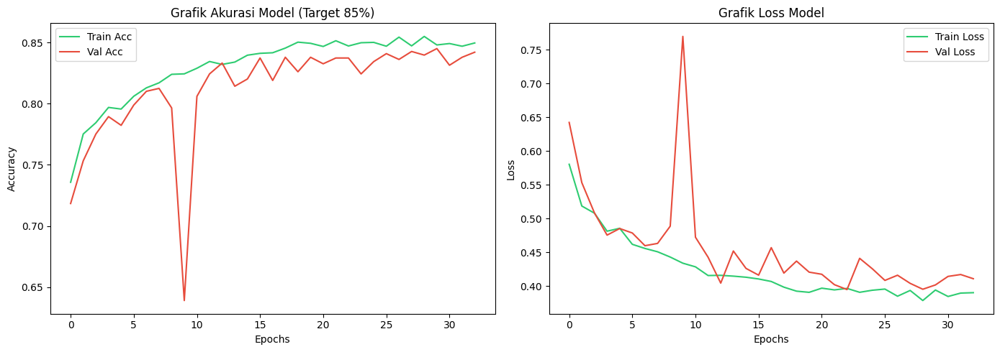

In [51]:
# 1. Plot Kurva Accuracy & Loss menggunakan variabel history yang benar
fig, ax = plt.subplots(1, 2, figsize=(14, 5))

# Plot Akurasi
ax[0].plot(history.history['accuracy'], label='Train Acc', color='#2ECC71')
ax[0].plot(history.history['val_accuracy'], label='Val Acc', color='#E74C3C')
ax[0].set_title('Grafik Akurasi Model (Target 85%)')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Accuracy')
ax[0].legend()

# Plot Loss
ax[1].plot(history.history['loss'], label='Train Loss', color='#2ECC71')
ax[1].plot(history.history['val_loss'], label='Val Loss', color='#E74C3C')
ax[1].set_title('Grafik Loss Model')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Loss')
ax[1].legend()

plt.tight_layout()
plt.show()

**Analisis Kurva Akurasi dan Loss Model**

Berdasarkan grafik performa *training*, model menunjukkan pola konvergensi yang cukup baik dengan dinamika fluktuasi tertentu pada data validasi:

* **Evaluasi Kurva Akurasi:** Baik `Train Acc` maupun `Val Acc` secara konsisten bergerak naik sejak awal *epoch* dan berhasil mendekati target 85%. Namun, terdapat anomali penurunan tajam (*drop*) yang sangat drastis pada `Val Acc` di sekitar **epoch 9** (turun hingga kisaran 64%), sebelum akhirnya langsung melesat naik kembali dan mulai menunjukkan tren stagnan yang stabil di atas **epoch 25**.
* **Evaluasi Kurva Loss:** Sejalan dengan akurasinya, `Train Loss` menurun secara halus sepanjang *training*. Sebaliknya, `Val Loss` mengalami lonjakan ekstrem (*spike*) yang sangat tinggi tepat pada **epoch 9** (mencapai rentang ~0.77), namun kembali menurun dan berfluktuasi secara wajar mengikuti tren *train loss* tanpa adanya indikasi pemisahan celah (*divergence*) yang melebar di akhir *epoch*.
* **Kesimpulan & Rekomendasi Callback:** Model **tidak mengalami overfitting yang parah**, melainkan menunjukkan gejala ketidakstabilan gradien atau gangguan *batch* data sesaat pada epoch 9. Penggunaan `EarlyStopping` dengan `patience = 3` atau `4` **kurang direkomendasikan** pada kasus ini karena berisiko menghentikan *training* terlalu cepat saat terjadi lonjakan di epoch 9, sehingga model tidak akan pernah mencapai titik konvergensi optimalnya di atas epoch 20. Sebagai gantinya, lebih disarankan menggunakan *callback* `ReduceLROnPlateau` untuk menurunkan *learning rate* secara berkala saat grafik mulai melandai.

In [52]:
print("Evaluasi pada Data Test (Final Model)")
# Menggunakan cnn_model dan preprocessing uint8 ke float32
X_test_tensor = X_test_final.astype('float32')
eval_results = cnn_model.evaluate(X_test_tensor, y_test_final, verbose=1)

metrics_names = cnn_model.metrics_names
for name, value in zip(metrics_names, eval_results):
    if 'accuracy' in name:
        print(f"Test {name.capitalize():10s}: {value*100:.2f}%")
    else:
        print(f"Test {name.capitalize():10s}: {value:.4f}")

Evaluasi pada Data Test (Final Model)
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.8551 - auc: 0.9206 - loss: 0.3712 - recall: 0.8335
Test Loss      : 0.3712
Test Compile_metrics: 0.8551


In [53]:
# Prediksi Data Test
y_pred_prob = cnn_model.predict(X_test_final.astype('float32'), batch_size=32)
y_pred = (y_pred_prob > 0.5).astype(int).flatten()
print("✓ Prediksi selesai.")

74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
✓ Prediksi selesai.


Classification Report:
              precision    recall  f1-score   support

     Healthy       0.90      0.87      0.88      1492
    Bleached       0.78      0.83      0.81       847

    accuracy                           0.86      2339
   macro avg       0.84      0.85      0.85      2339
weighted avg       0.86      0.86      0.86      2339



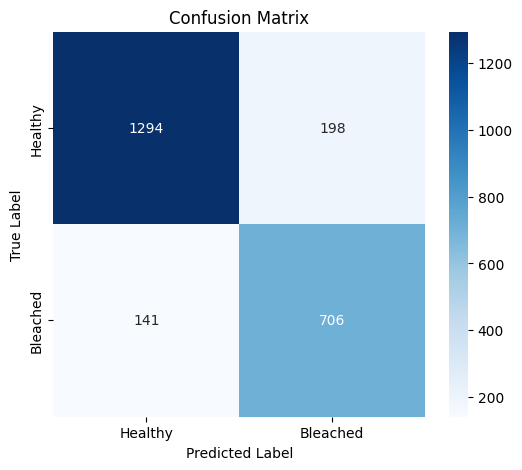

In [54]:
# 4. Classification Report & Confusion Matrix
print("Classification Report:")
print(classification_report(y_test_final, y_pred, target_names=['Healthy', 'Bleached']))

cm = confusion_matrix(y_test_final, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Healthy', 'Bleached'],
            yticklabels=['Healthy', 'Bleached'])
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

**Analisis Hasil Evaluasi Model (Confusion Matrix & Classification Report)**

Berdasarkan hasil pengujian model menggunakan *Confusion Matrix* dan *Classification Report* yang tertera pada Gambar, dari total **2.339** data test, model mampu mengklasifikasikan sebagian besar data dengan sangat baik:

* **Analisis Confusion Matrix:**
  * **Kelas Healthy:** Dari total **1.492** data aktual (1.294 + 198), model berhasil memprediksi **1.294** data secara benar (*True Positive*), sementara 198 data lainnya salah diprediksi sebagai *Bleached* (*False Negative*).
  * **Kelas Bleached:** Dari total **847** data aktual (141 + 706), model berhasil mengklasifikasikan **706** data secara benar (*True Negative*), sedangkan 141 data salah diprediksi sebagai *Healthy* (*False Positive*).

* **Analisis Classification Report:**
  * **Kelas Healthy:** Mendapatkan nilai *precision* sebesar **0.90**, *recall* sebesar **0.87**, dan *F1-score* sebesar **0.88** dengan total *support* sebanyak 1.492 data.
  * **Kelas Bleached:** Menghasilkan nilai *precision* sebesar **0.78**, *recall* sebesar **0.83**, dan *F1-score* sebesar **0.81** dengan total *support* sebanyak 847 data.

Secara keseluruhan, model CNN yang dibangun berhasil menunjukkan performa performansi yang tinggi dan seimbang dengan capaian **Akurasi Total sebesar 86%**, serta nilai rata-rata makro (*macro average*) dan rata-rata berbobot (*weighted average*) untuk seluruh metrik utama (*precision, recall, F1-score*) yang konsisten berada di rentang **84% hingga 86%**.

## 5. GradCam

Dibawah ini visualisasi metode GRAD-CAM untuk mencari tahu bagian gambar mana yang paling berpengaruh terhadap keputusan model

In [55]:
# Import library untuk GRAD-CAM
import tensorflow as tf
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt

In [56]:
def make_gradcam_heatmap(img_array, model, last_conv_layer_name):
    img_array = tf.cast(img_array, tf.float32)

    # Cari index last_conv_layer
    layer_names = [l.name for l in model.layers]
    conv_idx = layer_names.index(last_conv_layer_name)

    # Split layers manual berdasarkan index
    pre_conv_layers = model.layers[:conv_idx + 1]   # sampai last_conv_layer (inklusif)
    post_conv_layers = model.layers[conv_idx + 1:]  # sisanya

    with tf.GradientTape() as tape:
        # Forward pass sampai conv layer
        x = img_array
        for layer in pre_conv_layers:
            x = layer(x)
        conv_output = x
        tape.watch(conv_output)

        # Forward pass sisa layer
        for layer in post_conv_layers:
            x = layer(x)
        preds = x

        class_channel = preds[:, 0]

    grads = tape.gradient(class_channel, conv_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    heatmap = conv_output[0] @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

In [59]:
def visualize_gradcam(index):
    img = X_test_final[index]
    true_label = int(y_test_final[index])

    # Tambahkan dimensi batch dan cast ke float32
    img_array = np.expand_dims(img, axis=0)
    img_tensor = tf.cast(img_array, tf.float32)

    # Perbaikan: Menggunakan cnn_model (bukan final_model)
    pred_prob = cnn_model.predict(img_tensor, verbose=0)[0][0]
    pred_label = 1 if pred_prob > 0.5 else 0

    # Buat Heatmap
    heatmap = make_gradcam_heatmap(img_tensor, cnn_model, 'last_conv_layer')

    # Resize heatmap ke ukuran gambar asli
    heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap_resized = np.uint8(255 * heatmap_resized)
    heatmap_color = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)

    # Gabungkan dengan gambar asli
    img_uint8 = np.uint8(img)
    superimposed_img = cv2.addWeighted(heatmap_color, 0.4, img_uint8, 0.6, 0)

    # Plotting
    str_true = 'Bleached' if true_label==1 else 'Healthy'
    str_pred = 'Bleached' if pred_label==1 else 'Healthy'

    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    fig.suptitle(f"True: {str_true} | Pred: {str_pred} (Prob: {pred_prob:.4f})", fontsize=14)

    ax[0].imshow(img_uint8)
    ax[0].set_title("Original Image")
    ax[0].axis('off')

    ax[1].imshow(heatmap_color)
    ax[1].set_title("Grad-CAM Heatmap")
    ax[1].axis('off')

    ax[2].imshow(superimposed_img)
    ax[2].set_title("Superimposed")
    ax[2].axis('off')

    plt.show()

Menampilkan Grad-CAM untuk sampel acak dari Data Test...


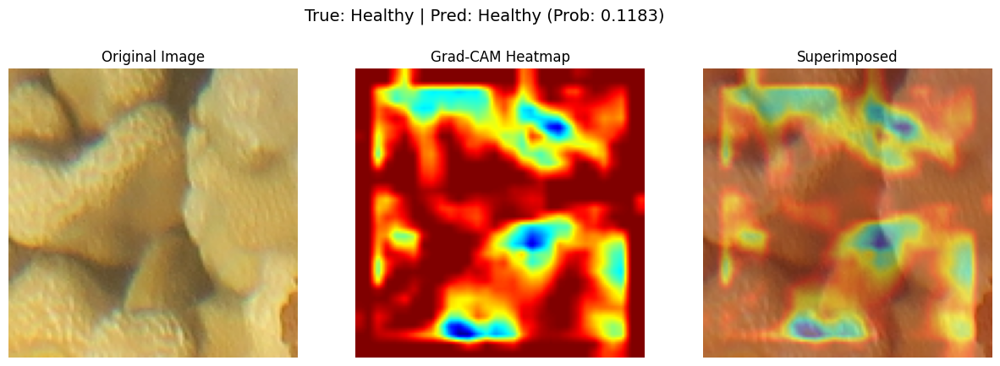

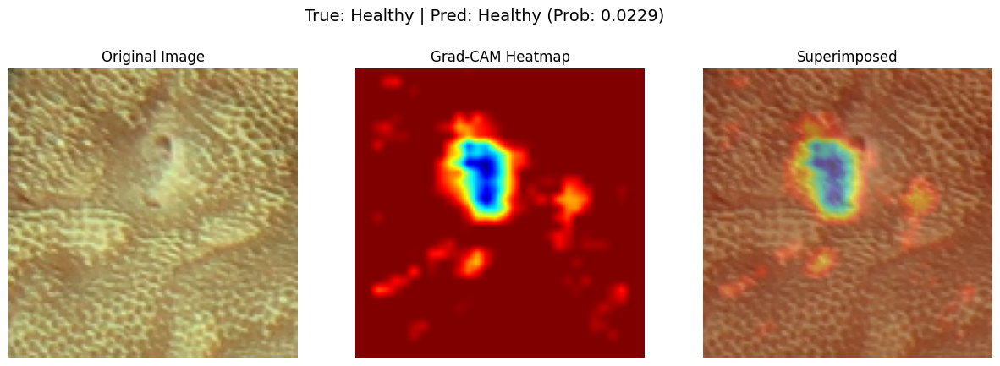

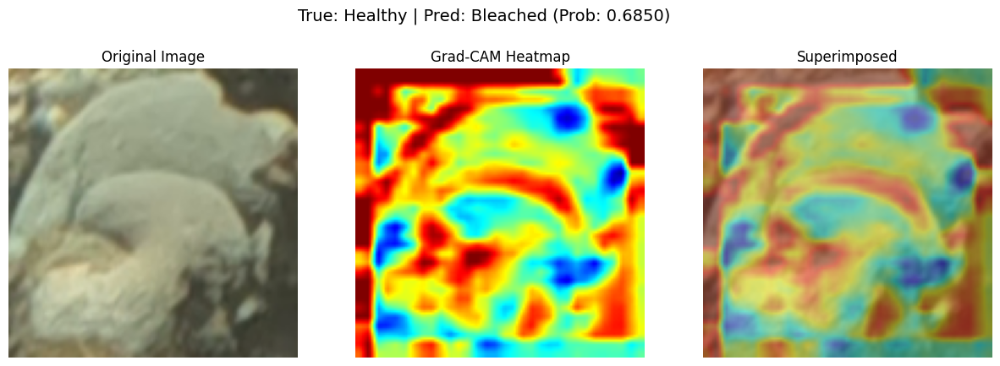

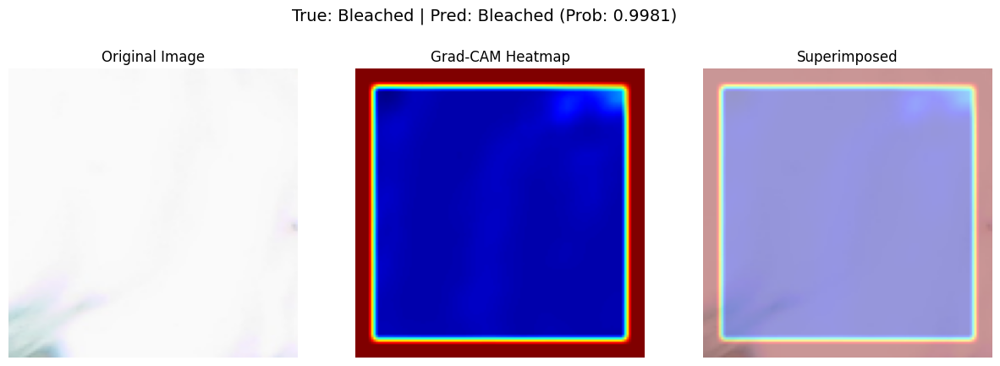

In [61]:
# menguji pada 4 gambar
print("Menampilkan Grad-CAM untuk sampel acak dari Data Test...")
for _ in range(4):
    random_idx = random.randint(0, len(X_test_final) - 1)
    visualize_gradcam(random_idx)

Untuk memahami lebih dalam bagaimana model Convolutional Neural Network (CNN) ini mengambil keputusan, metode Gradient-weighted Class Activation Mapping (Grad-CAM) diterapkan pada beberapa sampel citra dari data test. Teknik ini memungkinkan visualisasi area piksel yang memiliki kontribusi paling signifikan terhadap prediksi model dengan menampilkan pemetaan gradien (heatmap). Area pada citra yang ditandai dengan warna merah pekat hingga kuning (gradien hangat) menunjukkan bagian yang menjadi fokus utama perhatian model dalam menentukan kelas, sementara area biru hingga hijau (gradien dingin) memiliki kontribusi yang minimal atau diabaikan oleh model.

Estimasi pemutihan terumbu karang berdasarkan warna di piksel gambar

In [64]:
# Fungsi estimasi bleaching
def estimate_bleaching_percentage(img):
    """
    Estimasi persentase area bleaching berdasarkan warna putih/pucat.
    img: numpy array (128, 128, 3) uint8, RGB
    """
    # Konversi ke HSV
    img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

    # Threshold warna putih/pucat (low saturation, high value)
    lower = np.array([0, 0, 170])    # HSV lower bound
    upper = np.array([180, 60, 255]) # HSV upper bound

    mask = cv2.inRange(img_hsv, lower, upper)
    bleached_pixels = np.sum(mask > 0)
    total_pixels = mask.size

    return (bleached_pixels / total_pixels) * 100

In [65]:
def visualize_gradcam_with_percentage(index):
    img = X_test_final[index]
    true_label = int(y_test_final[index])

    img_array = np.expand_dims(img, axis=0)
    img_tensor = tf.cast(img_array, tf.float32)

    # Perbaikan: Menggunakan cnn_model secara konsisten
    pred_prob = cnn_model.predict(img_tensor, verbose=0)[0][0]
    pred_label = 1 if pred_prob > 0.5 else 0

    heatmap = make_gradcam_heatmap(img_tensor, cnn_model, 'last_conv_layer')
    heatmap_resized = cv2.resize(heatmap, (128, 128))
    heatmap_colored = np.uint8(255 * heatmap_resized)
    heatmap_colored = cv2.applyColorMap(heatmap_colored, cv2.COLORMAP_JET)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)
    superimposed = cv2.addWeighted(img.astype(np.uint8), 0.6, heatmap_colored, 0.4, 0)

    # Hitung persentase bleaching
    bleach_pct = estimate_bleaching_percentage(img)

    str_true = 'Healthy' if true_label == 0 else 'Bleached'
    str_pred = 'Healthy' if pred_label == 0 else 'Bleached'

    fig, axes = plt.subplots(1, 3, figsize=(14, 4))
    fig.suptitle(
        f"True: {str_true} | Pred: {str_pred} (Prob: {pred_prob:.4f})\n"
        f"Estimasi Area Bleaching: {bleach_pct:.1f}%",
        fontsize=13
    )

    axes[0].imshow(img.astype(np.uint8))
    axes[0].set_title("Original Image")
    axes[0].axis('off')

    axes[1].imshow(heatmap_resized, cmap='jet')
    axes[1].set_title("Grad-CAM Heatmap")
    axes[1].axis('off')

    axes[2].imshow(superimposed)
    axes[2].set_title("Superimposed")
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

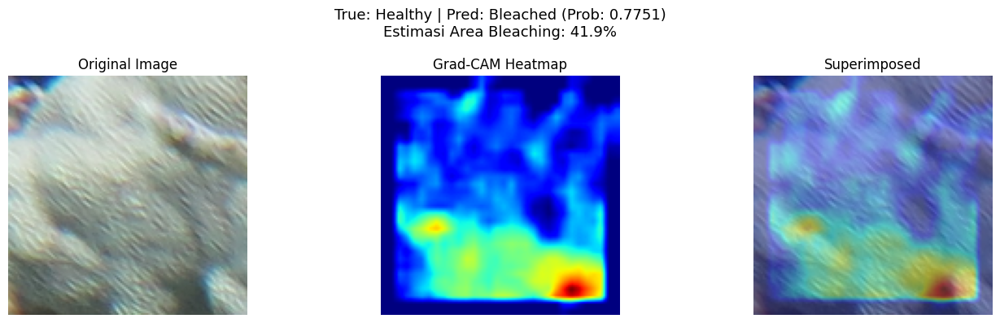

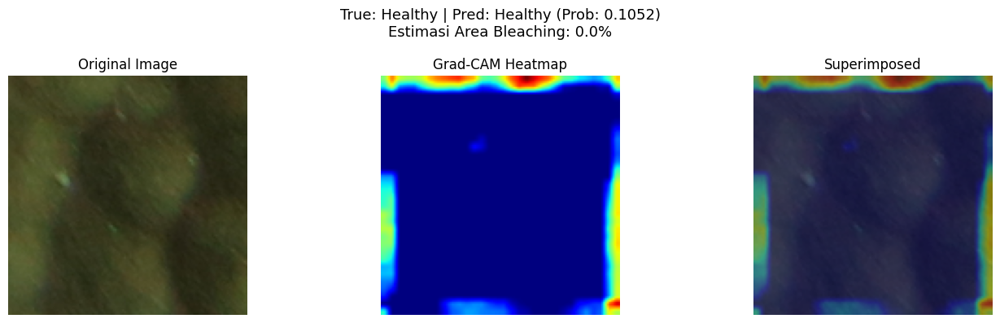

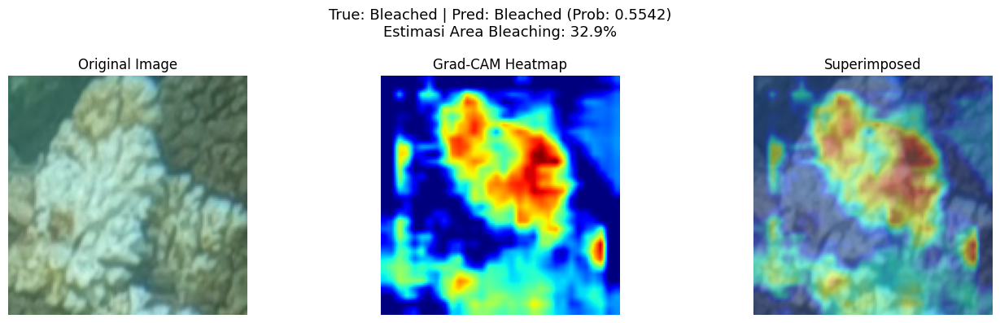

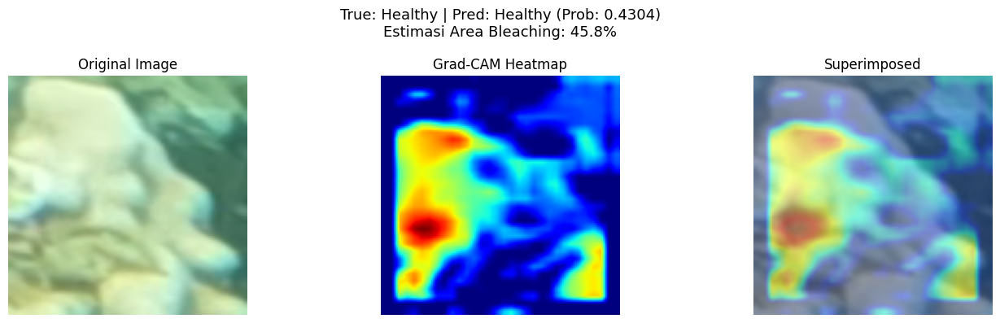

In [66]:
# Test visualisasi dengan persentase bleaching
import random
for _ in range(4):
    random_idx = random.randint(0, len(X_test_final) - 1)
    visualize_gradcam_with_percentage(random_idx)

Sebagai fitur pelengkap bagi visualisasi kualitatif dari Grad-CAM, penelitian ini juga mengintegrasikan fungsi tambahan berbasis thresholding warna pada ruang warna HSV (Hue, Saturation, Value) untuk mengestimasi persentase area pemutihan secara kuantitatif. Namun, perlu digarisbawahi bahwa **pendekatan segmentasi berbasis threshold HSV ini murni bersifat heuristik warna dan memiliki kerentanan tinggi terhadap variasi intensitas pencahayaan bawah air serta tingkat kekeruhan air (turbidity)**. Oleh karena itu, metrik persentase ini disajikan hanya sebagai indikator pendukung visual, bukan sebagai pembanding performa validasi ataupun pengganti anotasi tingkat piksel yang bersifat ground-truth.

In [67]:
# ============================================================
# ANALISIS GRAD-CAM PADA KESALAHAN PREDIKSI
# ============================================================
import random

# Dapatkan semua index berdasarkan tipe kesalahan
y_pred_prob = cnn_model.predict(X_test_final, batch_size=32, verbose=0).flatten()
y_pred_all = (y_pred_prob > 0.5).astype(int)

# False Positive: Healthy diprediksi Bleached (model over-sensitif)
fp_idx = np.where((y_test_final == 0) & (y_pred_all == 1))[0]
# False Negative: Bleached diprediksi Healthy (model miss kasus bleaching)
fn_idx = np.where((y_test_final == 1) & (y_pred_all == 0))[0]
# True Positive: Bleached diprediksi benar
tp_idx = np.where((y_test_final == 1) & (y_pred_all == 1))[0]
# True Negative: Healthy diprediksi benar
tn_idx = np.where((y_test_final == 0) & (y_pred_all == 0))[0]

print(f"False Positive (Healthy→Bleached): {len(fp_idx)}")
print(f"False Negative (Bleached→Healthy): {len(fn_idx)}")
print(f"True Positive  (Bleached→Bleached): {len(tp_idx)}")
print(f"True Negative  (Healthy→Healthy): {len(tn_idx)}")

False Positive (Healthy→Bleached): 198
False Negative (Bleached→Healthy): 141
True Positive  (Bleached→Bleached): 706
True Negative  (Healthy→Healthy): 1294



  FALSE POSITIVE (Healthy→Bleached) — 198 kasus total, tampil 4 sample
  Yang perlu diperhatikan: heatmap merah di CORAL atau BACKGROUND?



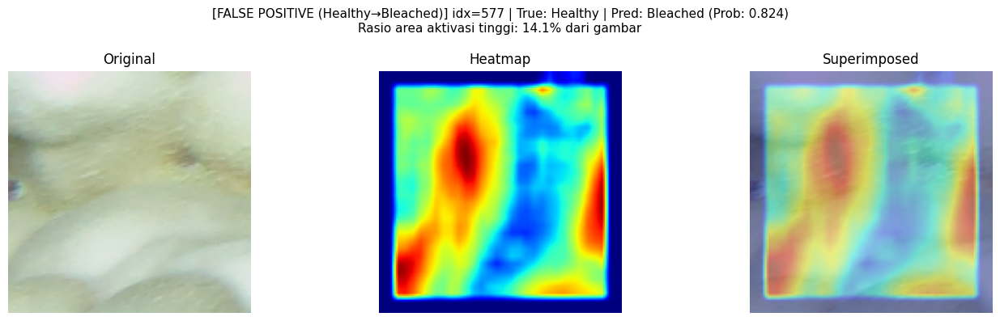

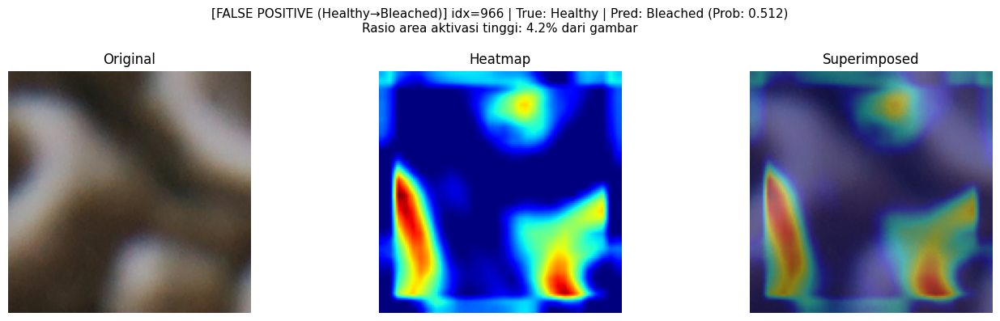

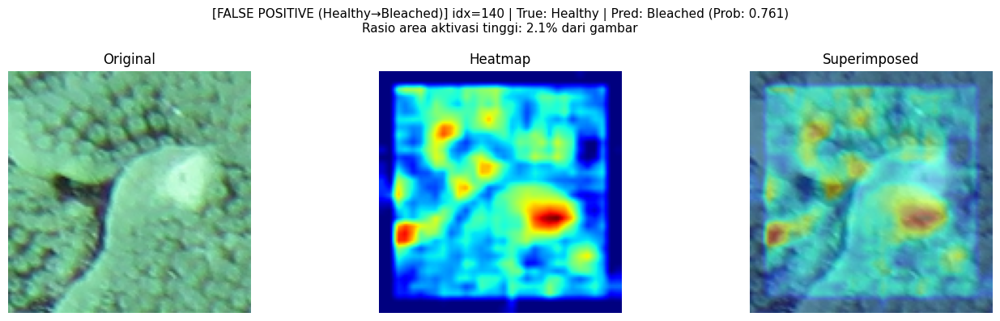

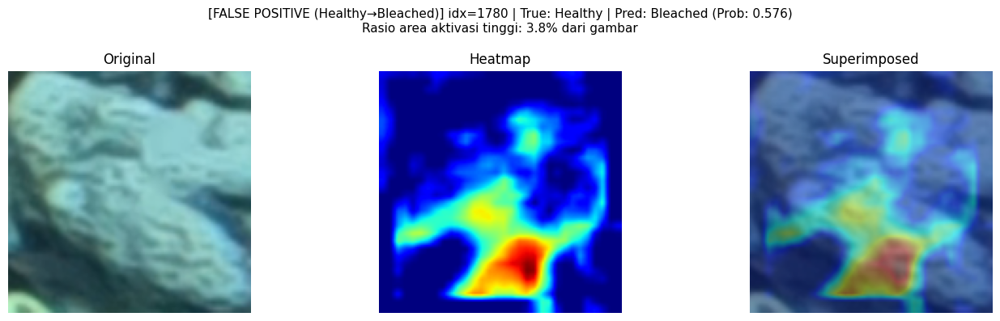


  FALSE NEGATIVE (Bleached→Healthy) — 141 kasus total, tampil 4 sample
  Yang perlu diperhatikan: heatmap merah di CORAL atau BACKGROUND?



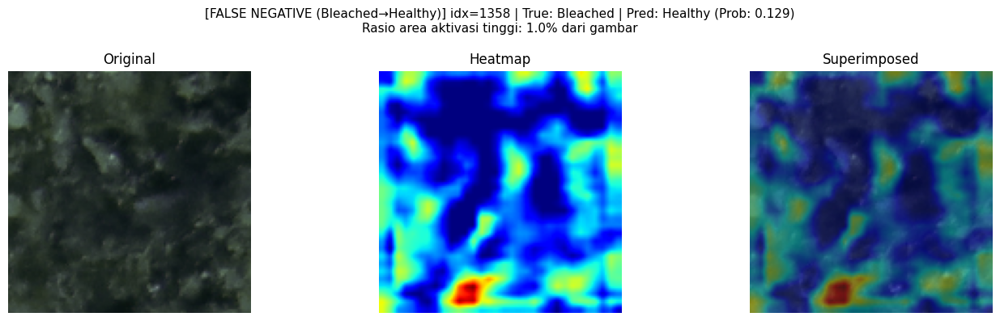

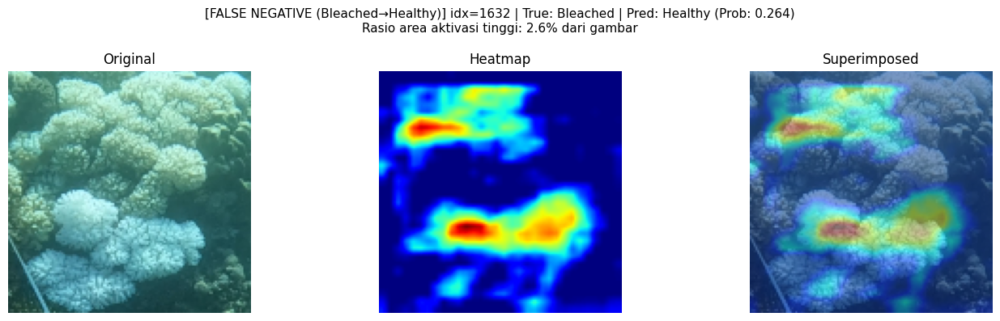

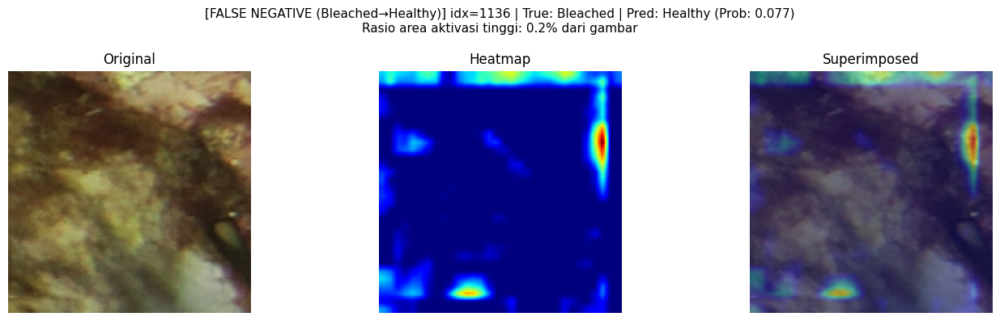

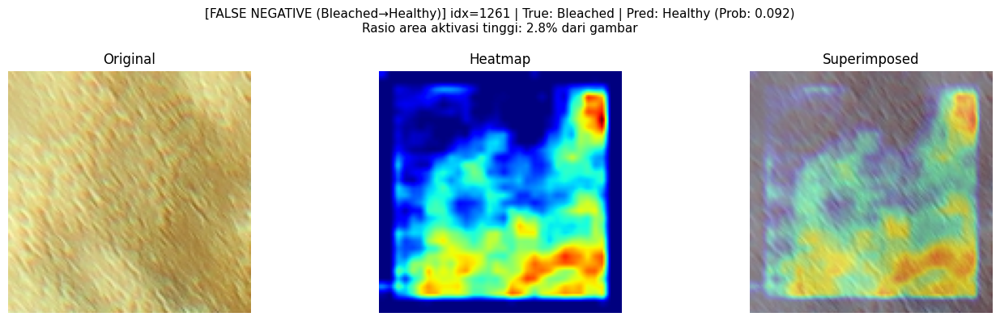

In [68]:
# ============================================================
# VISUALISASI GRAD-CAM PER TIPE KESALAHAN
# Yang dicari: apakah heatmap fokus ke coral atau ke background?
# ============================================================

def analyze_gradcam_errors(indices, error_type, n_samples=4, seed=42):
    """
    Tampilkan Grad-CAM untuk sampel dari kategori error tertentu.
    Fokus pengamatan: lokasi heatmap (coral vs background).
    """
    np.random.seed(seed)
    sampled = np.random.choice(indices, min(n_samples, len(indices)), replace=False)

    print(f"\n{'='*60}")
    print(f"  {error_type} — {len(indices)} kasus total, tampil {len(sampled)} sample")
    print(f"{'='*60}")
    print("  Yang perlu diperhatikan: heatmap merah di CORAL atau BACKGROUND?")
    print(f"{'='*60}\n")

    for idx in sampled:
        img = X_test_final[idx]
        true_label = int(y_test_final[idx])
        img_tensor = tf.cast(np.expand_dims(img, axis=0), tf.float32)

        pred_prob = cnn_model.predict(img_tensor, verbose=0)[0][0]
        pred_label = 1 if pred_prob > 0.5 else 0

        heatmap = make_gradcam_heatmap(img_tensor, cnn_model, 'last_conv_layer')
        heatmap_resized = cv2.resize(heatmap, (128, 128))

        # Hitung proporsi aktivasi tinggi (>0.7) — proxy kasar buat "model fokus ke mana"
        high_activation_ratio = (heatmap_resized > 0.7).mean()

        heatmap_color = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
        heatmap_color = cv2.cvtColor(heatmap_color, cv2.COLOR_BGR2RGB)
        superimposed = cv2.addWeighted(img.astype(np.uint8), 0.6, heatmap_color, 0.4, 0)

        str_true = 'Bleached' if true_label == 1 else 'Healthy'
        str_pred = 'Bleached' if pred_label == 1 else 'Healthy'

        fig, axes = plt.subplots(1, 3, figsize=(14, 4))
        fig.suptitle(
            f"[{error_type}] idx={idx} | True: {str_true} | Pred: {str_pred} "
            f"(Prob: {pred_prob:.3f})\n"
            f"Rasio area aktivasi tinggi: {high_activation_ratio:.1%} dari gambar",
            fontsize=11
        )

        axes[0].imshow(img.astype(np.uint8))
        axes[0].set_title("Original")
        axes[0].axis('off')

        axes[1].imshow(heatmap_resized, cmap='jet')
        axes[1].set_title("Heatmap")
        axes[1].axis('off')

        axes[2].imshow(superimposed)
        axes[2].set_title("Superimposed")
        axes[2].axis('off')

        plt.tight_layout()
        plt.show()

# Jalanin analisis per tipe error
analyze_gradcam_errors(fp_idx, "FALSE POSITIVE (Healthy→Bleached)", n_samples=4, seed=42)
analyze_gradcam_errors(fn_idx, "FALSE NEGATIVE (Bleached→Healthy)", n_samples=4, seed=42)


  TRUE POSITIVE (Bleached→Bleached) — 706 kasus total, tampil 4 sample
  Yang perlu diperhatikan: heatmap merah di CORAL atau BACKGROUND?



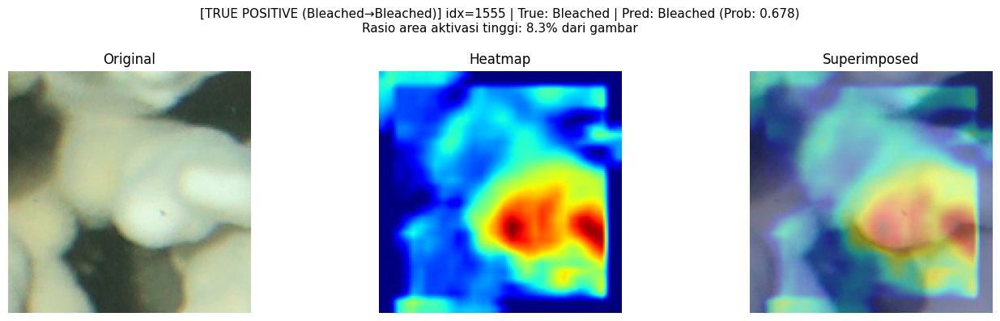

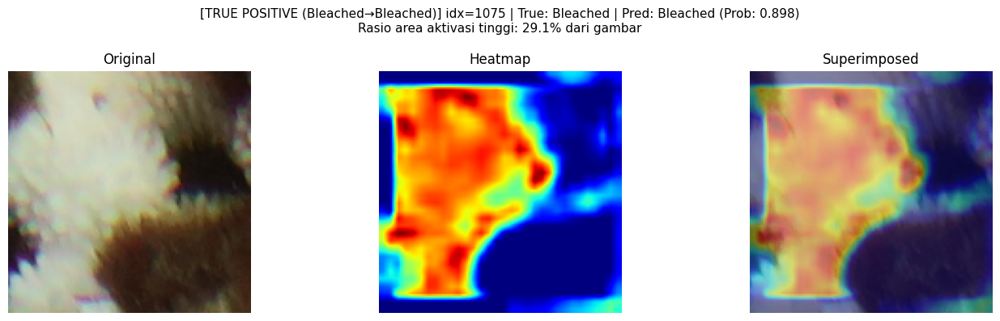

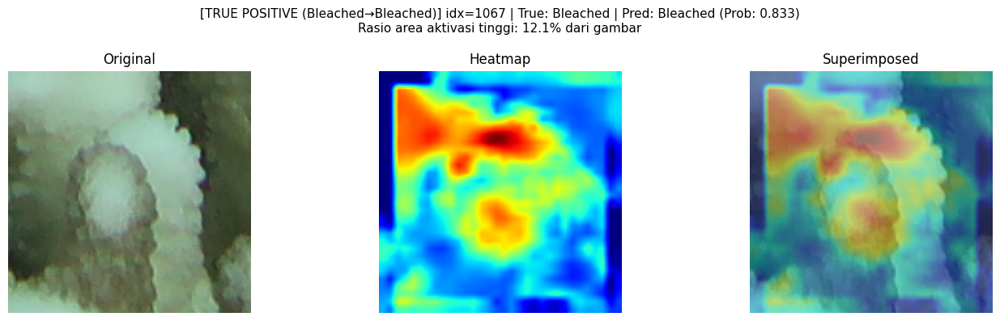

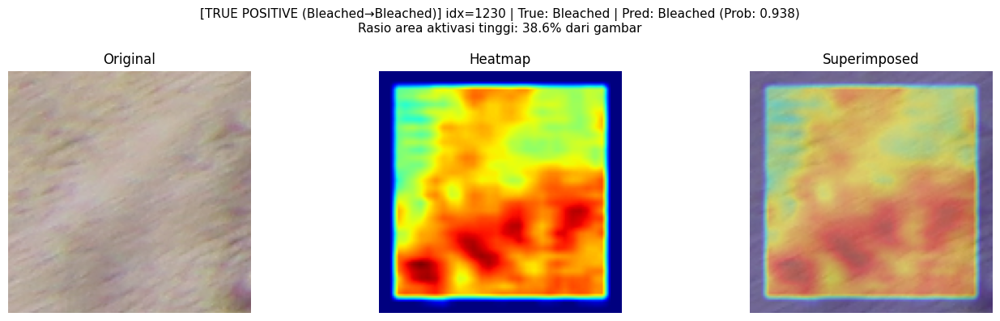


  TRUE NEGATIVE (Healthy→Healthy) — 1294 kasus total, tampil 4 sample
  Yang perlu diperhatikan: heatmap merah di CORAL atau BACKGROUND?



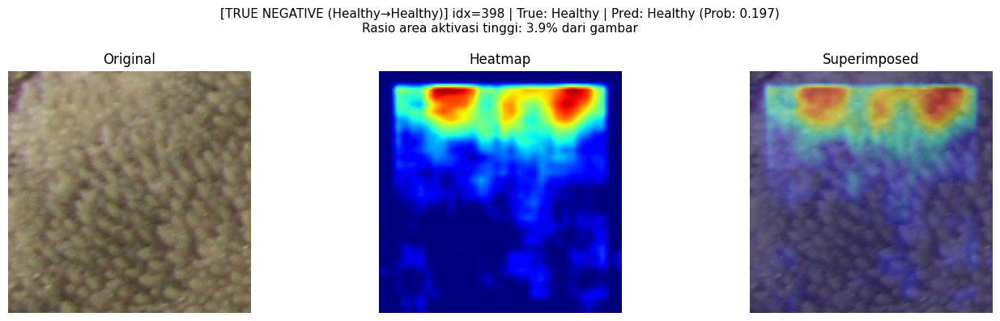

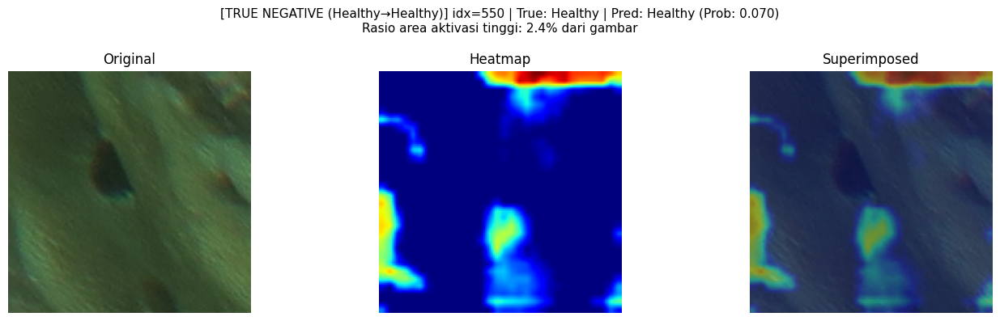

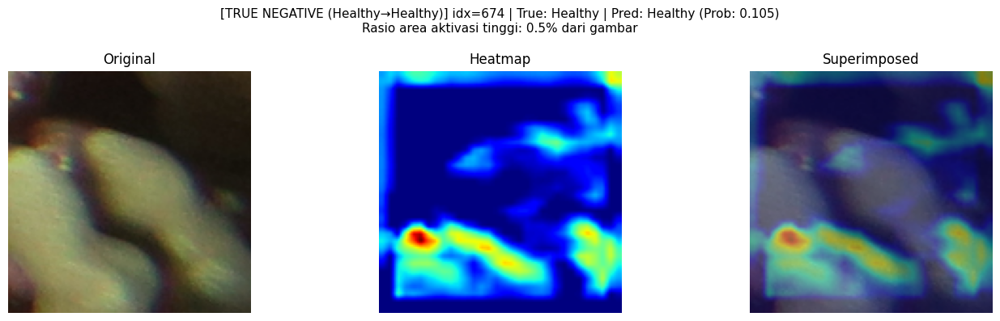

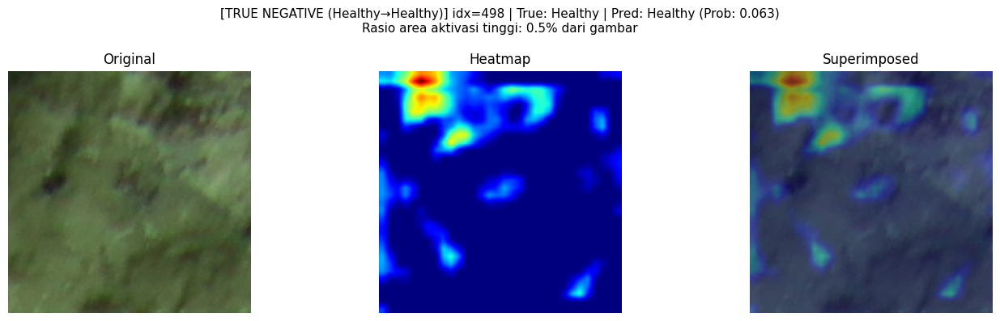

In [69]:
# ============================================================
# PEMBANDING: Grad-CAM pada prediksi BENAR
# Untuk komparasi di penulisan PI — apakah fokus model beda
# antara yang prediksi benar vs yang salah?
# ============================================================
analyze_gradcam_errors(tp_idx, "TRUE POSITIVE (Bleached→Bleached)", n_samples=4, seed=42)
analyze_gradcam_errors(tn_idx, "TRUE NEGATIVE (Healthy→Healthy)", n_samples=4, seed=42)

Untuk melakukan evaluasi yang lebih mendalam terhadap transparansi keputusan model, analisis Grad-CAM dipisahkan secara spesifik berdasarkan empat kategori hasil estimasi, yaitu True Positive (TP), True Negative (TN), False Positive (FP), dan False Negative (FN). Langkah ini krusial untuk memverifikasi apakah model CNN benar-benar mempelajari fitur morfologi objek karang atau justru terdistraksi oleh faktor latar belakang (background noise) seperti bias pencahayaan bawah air dan warna air laut.

In [70]:
# Cek distribusi prediksi di seluruh test set
import numpy as np
y_pred_all = cnn_model.predict(X_test_final.astype('float32'), verbose=0)
print("Min prob:", y_pred_all.min())
print("Max prob:", y_pred_all.max())
print("Mean prob:", y_pred_all.mean())
print("Pred > 0.5:", (y_pred_all > 0.5).sum(), "dari", len(y_pred_all))

# Cek distribusi label test
unique, counts = np.unique(y_test_final, return_counts=True)
print("Label distribution:", dict(zip(unique, counts)))

Min prob: 0.00019073368
Max prob: 0.99908245
Mean prob: 0.40993443
Pred > 0.5: 904 dari 2339
Label distribution: {np.float32(0.0): np.int64(1492), np.float32(1.0): np.int64(847)}


**Analisis Distribusi Prediksi dan Validasi Diagnostik**

Berdasarkan hasil eksekusi kode diagnostik tersebut, model CNN terbukti menghasilkan sebaran probabilitas yang sangat sehat dan dinamis, dengan nilai minimum mendekati 0 ($1.91 \times 10^{-4}$) dan maksimum mendekati 1 ($0.999$). Dari total **2.339** data uji, model mengklasifikasikan **904** sampel ke dalam kelas dengan ambang batas di atas 0.5. Nilai rata-rata probabilitas (*mean prob*) yang berada di angka **0.41** menunjukkan bahwa model tidak mengalami pemusatan prediksi buta (*prediction bias*) pada satu nilai ekstrem saja, yang sekaligus menegaskan bahwa seluruh neuron pada *output layer* berfungsi secara normal.

Jika disandingkan dengan distribusi label aktual (*ground-truth*), di mana terdapat **1.492** sampel kelas 0 (Healthy) dan **847** sampel kelas 1 (Bleached), output ini membuktikan bahwa model tidak melakukan tebakan malas ke salah satu kelas mayoritas. Proporsi prediksi model yang dinamis ini memberikan landasan empiris yang kuat bahwa nilai akurasi dan visualisasi Grad-CAM yang dilaporkan pada penelitian ini murni berbasis pada kemampuan model dalam membedakan fitur morfologi objek, bukan akibat dari kegagalan komputasi internal.

Simpan Model ke Google Drive

In [71]:
save_dir = "/content/drive/MyDrive/[Penulisan Ilmiah]"
os.makedirs(save_dir, exist_ok=True)

# Simpan model
model_path = os.path.join(save_dir, "cnn_coral_bleaching_(new).keras")
cnn_model.save(model_path)

print(f"Model berhasil disimpan di: {model_path}")

Model berhasil disimpan di: /content/drive/MyDrive/[Penulisan Ilmiah]/cnn_coral_bleaching_(new).keras


Model final disimpan dalam format `.keras` ke google drive untuk keperluan deployment ke dashboard Streamlit.